### _METRO_Interstate_Traffic_Volume

> Датасет включает в себя
- Датасет содержит информацию о количестве автомобилей, проезжающих через станцию метро в западном направлении в Миннеаполисе, США, с 2012 по 2018 год. Датасет также включает данные о погоде, праздниках и времени суток. 
- Ежечасную интенсивность движения на межштатной автомагистрали 94 в западном направлении для станции метро 301 DOT, примерно на полпути между Миннеаполисом и Сент-Полом, штат Миннесота.
- Почасовые погодные характеристики и праздничные дни ВКЛЮЧЕНЫ для влияния на объем трафика.
- Всего в датасете 48204 записи и 9 признаков.
- Пропущенные значения отсутствуют
- https://archive.ics.uci.edu/ml/datasets/Metro+Interstate+Traffic+Volume

Процесс машинного обучения временных рядов состоит из нескольких этапов:

- Сбор и предобработка данных. На этом этапе необходимо собрать данные, которые отражают изменение некоторой величины во времени, например, температуру, продажи, акции и т.д. Затем нужно проверить данные на качество, заполнить пропуски, удалить выбросы и привести данные к однородному формату.
- Анализ и визуализация данных. На этом этапе необходимо исследовать данные, чтобы выявить основные характеристики, такие как тренд, сезонность, цикличность и шум. Также нужно визуализировать данные, чтобы наглядно увидеть их поведение и динамику.
- Разработка признаков и разбиение данных. На этом этапе необходимо создать признаки, которые будут использоваться для обучения модели. Признаки могут быть основаны на статистических свойствах данных, лагах, скользящих средних, преобразованиях и т.д. 
- Затем нужно разбить данные на обучающую, валидационную и тестовую выборки, чтобы оценить качество модели.
- Выбор и обучение модели. На этом этапе необходимо выбрать подходящую модель для прогнозирования временных рядов, например, линейную регрессию, ARIMA, LSTM, Prophet и т.д. Затем нужно обучить модель на обучающей выборке, используя оптимальные гиперпараметры и функцию потерь.
- Оценка и тестирование модели. На этом этапе необходимо оценить качество модели на валидационной выборке, используя различные метрики, такие как MSE, MAE, MAPE и т.д. Также нужно проверить модель на тестовой выборке, чтобы убедиться в ее обобщающей способности и стабильности.
- Интерпретация и применение модели. На этом этапе необходимо интерпретировать результаты модели, чтобы понять, какие факторы влияют на прогноз, какие сценарии возможны и какие риски существуют. Также нужно применить модель к новым данным, чтобы получить прогноз на будущий период.


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

##### 1.1 Загрузка датасета

#### 1. Предварительный анализ данных

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

from scipy.optimize import minimize
from scipy.stats import boxcox
from scipy.special import inv_boxcox

from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error, mean_squared_error, mean_squared_log_error
from sklearn.model_selection import TimeSeriesSplit, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge, LassoCV, RidgeCV
# Импорт класса GradientBoostingRegressor из библиотеки sklearn.ensemble, который представляет модель градиентного бустинга 
# для регрессии
from sklearn.ensemble import GradientBoostingRegressor, RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split

# Импорт библиотеки statsmodels для работы со статистическими моделями
import statsmodels.api as sm
# Импорт модуля statsmodels.tsa для работы с временными рядами
import statsmodels.tsa.api as smt

from itertools import product
from tqdm import tqdm_notebook

import warnings
warnings.filterwarnings("ignore")

def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


In [7]:
%%time
df = pd.read_csv("Metro_Interstate_Traffic_Volume.csv", sep=",")

CPU times: total: 141 ms
Wall time: 401 ms


In [4]:
# Посмотрим на данные
df.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
0,NaN,288.28,0.0,0.0,40,Clouds,scattered clouds,2012-10-02 09:00:00,5545
1,NaN,289.36,0.0,0.0,75,Clouds,broken clouds,2012-10-02 10:00:00,4516
2,NaN,289.58,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 11:00:00,4767
3,NaN,290.13,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 12:00:00,5026
4,NaN,291.14,0.0,0.0,75,Clouds,broken clouds,2012-10-02 13:00:00,4918


Датасет содержит следующие признаки:
- holiday - категориальный признак, показывающий, является ли день некоторым праздником или нет
- temp - числовой признак, показывающий температуру воздуха в Кельвинах
- date_time - датовременной признак, показывающий дату и время наблюдения
- traffic_volume - числовой признак, показывающий количество автомобилей, проезжающих через станцию метро за час (наша целевая переменная)

In [5]:
df = df[['traffic_volume', 'date_time', 'holiday', 'temp']]

df = df[['traffic_volume', 'date_time', 'holiday', 'temp']].set_index('date_time')

Эти признаки мы выкинули
- rain_1h - числовой признак, показывающий количество осадков в миллиметрах за последний час
- snow_1h - числовой признак, показывающий количество снега в миллиметрах за последний час
- clouds_all - числовой признак, показывающий процент облачности
- weather_main - категориальный признак, показывающий основную погоду
- weather_description - категориальный признак, показывающий детальное описание погоды

In [6]:
# Всего в датасете 48204 записи и 4 признака (5 мы выкинули).
df.shape

(48204, 4)

In [7]:
# Посмотрим на данные
df.head()

,traffic_volume,date_time,holiday,temp
0,5545,2012-10-02 09:00:00,NaN,288.28
1,4516,2012-10-02 10:00:00,NaN,289.36
2,4767,2012-10-02 11:00:00,NaN,289.58
3,5026,2012-10-02 12:00:00,NaN,290.13
4,4918,2012-10-02 13:00:00,NaN,291.14


##### 1.2 Предварительный анализ: Проверяем данные на наличие дубликатов и неравномерных временных интервалов.

In [8]:
# Проверка на дубликаты
print(df.duplicated(subset='date_time').sum())

7629


In [9]:
# Удаляем дубликаты по столбцу 'date_time'
df = df.drop_duplicates(subset='date_time')

In [10]:
# Проверка на дубликаты
print(df.duplicated(subset='date_time').sum())

0


In [11]:
# Проверка на дубликаты всего датафрейма
print(df.duplicated().sum())

0


##### 1.3 Предварительный анализ: Преобразую столбец date_time в формат datetime 

In [12]:
# Преобразуем столбец date_time в формат datetime
# Используем функцию to_datetime из библиотеки pandas
# Она принимает объект Series с датами и временем в виде строк
# И возвращает объект Series с датами и временем в виде объектов datetime
# Присваиваем результат обратно в столбец date_time

df["date_time"] = pd.to_datetime(df["date_time"])


# Выводим первые пять строк DataFrame
print(df.head())

   traffic_volume           date_time holiday    temp
0            5545 2012-10-02 09:00:00     NaN  288.28
1            4516 2012-10-02 10:00:00     NaN  289.36
2            4767 2012-10-02 11:00:00     NaN  289.58
3            5026 2012-10-02 12:00:00     NaN  290.13
4            4918 2012-10-02 13:00:00     NaN  291.14


In [13]:
# Посмотрим на статистику

df.describe()


,traffic_volume,date_time,temp
count,40575.000000,40575,40575.000000
mean,3290.650474,2015-12-23 22:16:28.835489792,281.316763
min,0.000000,2012-10-02 09:00:00,0.000000
25%,1248.500000,2014-02-02 19:30:00,271.840000
50%,3427.000000,2016-06-02 14:00:00,282.860000
75%,4952.000000,2017-08-02 23:30:00,292.280000
max,7280.000000,2018-09-30 23:00:00,310.070000
std,1984.772909,NaN,13.816618


Из вывода видно, что:
- Средняя температура воздуха составляет 281 К, что соответствует 8 °C. Минимальная температура равна 0 К, что является аномальным значением. Максимальная температура равна 310 К, что соответствует 37 °C.
- Среднее количество автомобилей, проезжающих через станцию метро за час, составляет 3259. Минимальное значение равно 0, что означает полное отсутствие трафика. Максимальное значение равно 7280, что означает очень высокую загруженность метро.

In [14]:
# Проверим тип данных столбца в pandas DataFrame, используем атрибут dtypes для всего DataFrame 
# или метод dtype для отдельного столбца 
print(df.dtypes)

#print(df["date_time"].dtype)

traffic_volume             int64
date_time         datetime64[ns]
holiday                   object
temp                     float64
dtype: object


Теоритическая справка:
- Тип данных datetime64[ns] в pandas представляет даты и времена. Он используется для хранения информации о дате и времени в формате, который удобен для анализа и манипуляций с временными рядами. Вот что означает каждая часть этого типа данных:
- datetime64: Это базовый тип данных NumPy, который представляет дату и время. В pandas он используется для работы с временными рядами.
- [ns]: Это означает, что временные метки имеют разрешение в наносекундах. Один наносекунд — это одна миллиардная секунды (10^-9 секунды). Это стандартное разрешение для временных меток в pandas, и оно позволяет представлять даты и времена с высокой точностью.
- В datetime64[ns] в pandas, это означает, что данные в столбце могут быть использованы для операций с датами и временем, таких как вычисление разницы между датами, извлечение определенных компонентов даты (например, года, месяца, дня) или ресемплинг данных по временным интервалам.

##### Проверка равномерности временных интервалов

In [15]:
# Проверка равномерности временных интервалов
# Вычисляем разницу между соседними значениями в столбце date_time
# Метод diff() возвращает объект Series с разностями
# Метод unique() возвращает уникальные значения в Series
# Выводим уникальные разности на экран
print(df['date_time'].diff().unique())

<TimedeltaArray>
[                NaT,   '0 days 01:00:00',   '0 days 02:00:00',
   '0 days 03:00:00',   '0 days 04:00:00',   '0 days 05:00:00',
   '0 days 08:00:00',   '0 days 09:00:00',   '0 days 07:00:00',
   '0 days 13:00:00',   '1 days 01:00:00',   '0 days 06:00:00',
   '0 days 14:00:00',   '1 days 23:00:00',   '1 days 06:00:00',
   '0 days 15:00:00',   '0 days 12:00:00',   '0 days 11:00:00',
   '0 days 22:00:00',   '1 days 00:00:00',   '0 days 17:00:00',
   '0 days 10:00:00',  '10 days 03:00:00',   '4 days 21:00:00',
   '0 days 21:00:00',   '2 days 17:00:00',   '1 days 09:00:00',
 '307 days 19:00:00',   '4 days 22:00:00',   '0 days 18:00:00',
   '1 days 10:00:00',   '3 days 21:00:00']
Length: 32, dtype: timedelta64[ns]


- Проверим, равномерно ли распределены значения дат и времени в DataFrame. 
- Вывод: У нас получилось несколько значений, например, Timedelta (‘0 days 00:00:00’), Timedelta (‘0 days 01:00:00’), Timedelta (‘0 days 02:00:00’), то это означает, что у нас есть пропуски или неравномерные интервалы.

In [16]:
# Устанавливаем 'date_time' в качестве индекса
df = df.set_index('date_time')


In [17]:
# Создаем полный диапазон дат и времени для ресемплинга
# Используем функцию date_range из библиотеки pandas
# Она принимает начальную и конечную дату и время, а также частоту
# И возвращает объект DatetimeIndex с равномерно распределенными значениями
# Указываем start как минимальное значение в индексе DataFrame
# Указываем end как максимальное значение в индексе DataFrame
# Указываем freq как 'H' для часового интервала
# Присваиваем результат в переменную full_date_range
full_date_range = pd.date_range(start=df.index.min(), end=df.index.max(), freq='H')

- Интерполяция — это математическая техника, используемая для оценки значений между двумя известными точками на основе различных методов. В контексте временных рядов и прогнозирования, интерполяция часто используется для заполнения пропусков в данных.
-  Линейная интерполяция предполагает, что значение между двумя точками прямо пропорционально расстоянию между ними.

- Однако, мы не учли, что при выравнивании временных интервалов и последующей интерполяции, значения в столбцах ‘holiday’ и ‘temp’ также будут интерполированы, что может быть некорректно.

 - Линейная интерполяция обычно используется для заполнения пропусков в числовых данных. Однако, столбец datetime, который является индексом, представляет собой временные метки и не содержит числовых значений, которые можно было бы интерполировать.

In [18]:
print(df['holiday'])

date_time
2012-10-02 09:00:00    NaN
2012-10-02 10:00:00    NaN
2012-10-02 11:00:00    NaN
2012-10-02 12:00:00    NaN
2012-10-02 13:00:00    NaN
                      ... 
2018-09-30 19:00:00    NaN
2018-09-30 20:00:00    NaN
2018-09-30 21:00:00    NaN
2018-09-30 22:00:00    NaN
2018-09-30 23:00:00    NaN
Name: holiday, Length: 40575, dtype: object


In [19]:
# Посмотрим на праздники
print(df['holiday'].value_counts())

holiday
Columbus Day                 5
Veterans Day                 5
Thanksgiving Day             5
Christmas Day                5
New Years Day                5
Washingtons Birthday         5
Memorial Day                 5
Independence Day             5
State Fair                   5
Labor Day                    5
Martin Luther King Jr Day    3
Name: count, dtype: int64


У нас моного категорий используем  Label Encoding 

Теоритическая справка
- При работе с временными рядами категориальные переменные могут быть особенно важными, поскольку они могут влиять на временной ряд. Например, праздники или торговые дни могут иметь значительное влияние на трафик метро.
- Вместо того чтобы просто удалять или игнорировать эти категориальные переменные, мы можем преобразовать их в числовые значения с помощью методов.
- Если у вас есть категориальная переменная, которая меняется со временем (например, праздник или торговый день), мы можем использовать - One-Hot Encoding или Label Encoding. One-Hot Encoding создаст новый столбец для каждой уникальной категории, что может быть полезно, если у нас много различных категорий.
- Label Encoding присвоит каждой уникальной категории уникальное целочисленное значение, что может быть более эффективным, если у нас много категорий.

In [20]:
# One-Hot Encoding
#df = pd.get_dummies(df, columns=['holiday'])

# Label Encoding
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['holiday'] = le.fit_transform(df['holiday'])

In [21]:
# Заполнение пропусков в столбцах 'holiday' и 'temp'
#df['holiday'] = df['holiday'].fillna(method='ffill')
df['temp'] = df['temp'].fillna(method='ffill')

# можно и так df['temp'] = df['temp'].ffill()

In [22]:
# Линейная интерполяция - это метод, при котором промежуточные значения вычисляются по формуле прямой,
# проходящей через две соседние точки

# Линейная интерполяция для столбца traffic_volume
df['traffic_volume'] = df['traffic_volume'].interpolate(method='linear')


Теоритическая справка (это нам не подходит)
- Есть несколько способов преобразования категориальных переменных в числовые, включая:
- One-Hot Encoding: Этот метод создает новые столбцы для каждой уникальной категории в исходном столбце. Каждый новый столбец содержит 1, если исходная категория соответствует этому столбцу, и 0 в противном случае. В Pandas это можно сделать с помощью функции get_dummies().
- Label Encoding: Этот метод присваивает каждой уникальной категории уникальное целочисленное значение. В Pandas это можно сделать с помощью класса LabelEncoder из библиотеки sklearn.preprocessing.
- Ordinal Encoding: Этот метод похож на Label Encoding, но используется для переменных, где категории имеют определенный порядок (например, оценки “плохо”, “средне”, “хорошо”). В Pandas это можно сделать с помощью класса OrdinalEncoder из библиотеки sklearn.preprocessing.
- Выбор метода зависит от природы данных и модели, которую мы используем. 
- Для временных рядов, если у нас есть категориальные переменные, которые меняются со временем (например, праздники), One-Hot Encoding или Label Encoding могут быть подходящими. Однако, если у вас есть большое количество уникальных категорий, это может привести к большому количеству новых столбцов при использовании One-Hot Encoding, что может затруднить обучение модели. В этом случае Label Encoding может быть более подходящим.
- Важно помнить, что некоторые модели (например, линейные модели) могут интерпретировать числовые значения как порядковые, поэтому использование Label Encoding с такими моделями может привести к некорректным результатам, если порядок меток не имеет значения. В этих случаях One-Hot Encoding может быть более подходящим.

Примечание:
- Мы можем предотвратить "загрязнение" наших данных некорректными значениями после интерполяции.
- Если мы применем линейную интерполяцию к столбцам ‘holiday’ и ‘temp’, это может привести к некорректным результатам.
- В случае столбца ‘holiday’, который является категориальной переменной, интерполяция может привести к появлению несуществующих категорий. Например, если у нас есть два праздничных дня, между которыми есть пропуск, интерполяция может создать “полупраздник”, что не имеет смысла.
- Что касается столбца ‘temp’, то если температура воздуха не меняется линейно (а это часто так), то интерполяция может дать неточные результаты. Например, если у нас есть два временных интервала, один с высокой температурой днем, а другой с низкой температурой ночью, линейная интерполяция может некорректно оценить температуру в промежуточное время.
- Поэтому вместо интерполяции может быть лучше использовать метод заполнения пропусков, который соответствует природе данных. Например, можно использовать метод ‘ffill’, который просто продолжает последнее известное значение до следующего известного значения. Это может быть более подходящим подходом для этих столбцов.

In [23]:
print(df.isnull().sum())

traffic_volume    0
holiday           0
temp              0
dtype: int64


In [24]:
# Проверим тип данных столбца в pandas DataFrame, используем атрибут dtypes для всего DataFrame 
# или метод dtype для отдельного столбца 
print(df.dtypes)

traffic_volume      int64
holiday             int32
temp              float64
dtype: object


In [25]:
 %%time
 from tqdm import tqdm
# данные содержат строковое значение None в столбце holiday. В Python, None обычно используется для обозначения отсутствующих или неизвестных значений.
df.head(5)

CPU times: total: 0 ns
Wall time: 1.05 ms


,traffic_volume,holiday,temp
date_time,,,
2012-10-02 09:00:00,5545,11,288.28
2012-10-02 10:00:00,4516,11,289.36
2012-10-02 11:00:00,4767,11,289.58
2012-10-02 12:00:00,5026,11,290.13
2012-10-02 13:00:00,4918,11,291.14


 Теоритическая справка
 - Линейная интерполяция обычно используется для заполнения пропусков в числовых данных. Однако, столбец datetime, который является индексом, представляет собой временные метки и не содержит числовых значений, которые можно было бы интерполировать.
- Если у нас есть пропуски в этом столбце, это может указывать на проблему с данными, которую следует исправить. Временные метки должны быть непрерывными и не содержать пропусков.
- Если у есть пропуски в данных, которые связаны с временем, следует рассмотреть возможность заполнения этих пропусков другими способами, такими как forward fill (замена пропусков на последнее известное значение) или backward fill (замена пропусков на следующее известное значение).

In [26]:
# Проверка на индексы
if 'date_time' in df.columns:
    print("Column 'date_time' exists.")
else:
    print("Column 'date_time' does not exist.")

Column 'date_time' does not exist.


#### 2. Моделирование:

- Теперь, когда ряд выглядит более-менее адекватно, настало время прогнозировать. Нашей целью будет построить модель, которая способна прогнозировать загрузку метро на ближайшую неделю (т.е, так как данные у нас дневные, модель должна предсказывать на 24*7 точек вперёд).

In [27]:
# Строим функцией график
def plot_data(df):
    df.plot(figsize=(16,4))
    plt.xticks(rotation=45)
    plt.show()

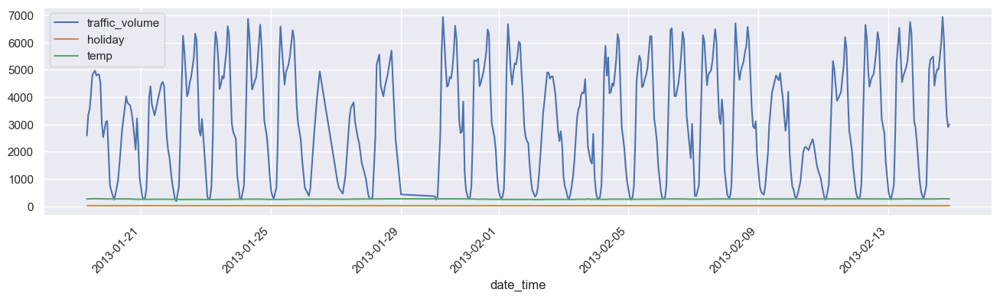

In [28]:
plot_data(df[2500:3000])

 График может быть полезен для визуализации изменений значений во времени или для сравнения различных переменных. Он может помочь выявить тренды, циклы или аномалии в данных. 

Вывод:
- График показывает, как меняются значения четырех переменных: traffic_volume, temp, holiday по дате и времени.
Можно сделать следующие наблюдения:
- Переменная traffic_volume имеет сильную сезонность, то есть она колеблется в зависимости от времени суток и дня недели. Например, она достигает пиковых значений в утренние и вечерние часы, когда люди едут на работу или с работы, а также в выходные дни, когда люди ездят по делам или развлечениям. Она падает до минимальных значений в ночное время, когда дороги свободны.
- Переменная temp имеет слабую сезонность, то есть она колеблется в зависимости от времени года. Например, она повышается в летние месяцы и понижается в зимние месяцы. Она также имеет некоторую дневную вариацию, то есть она выше в дневное время и ниже в ночное время, однако она имеют много нулевых значений.
- Переменная holiday имеют много нулевых значений, то есть большую часть времени не было дождя или снега. 

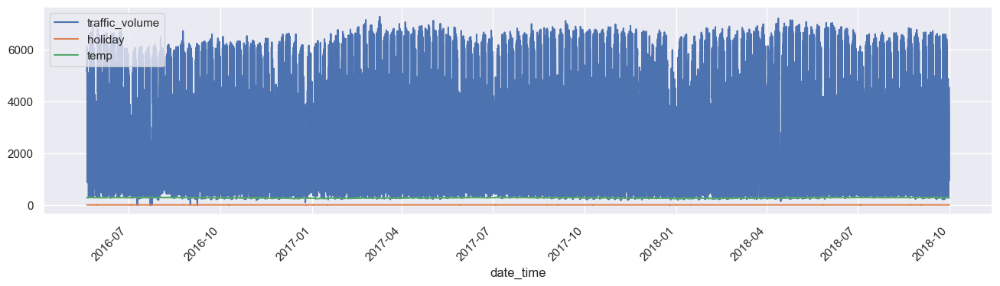

In [29]:
# Работаем с частью данных

plot_data(df[20000:55000])

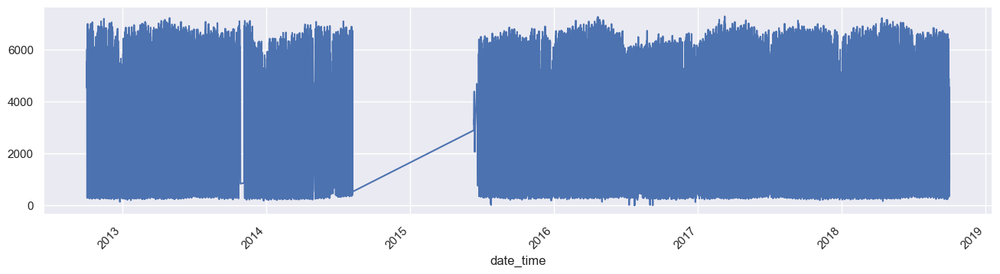

In [30]:
# Анализируем нашу целевую переменную
plot_data(df['traffic_volume']) 

Вывод:
- У нас в 2015 не было данных, поэтому его можно выкинуть. Но, это только предположение

- На графике видно, что объем трафика на дорогах в США, имеет сезонную составляющую, а также некоторые выбросы.
- Для прогнозирования текущих значений можно использовать данные за предыдущие периоды времени, чтобы модель могла выявить закономерности и тренды в данных. - Однако, для того чтобы определить, какие исторические данные действительно будут релевантны для прогнозов текущих значений, можно использовать методы анализа временных рядов, такие как автокорреляционная функция (ACF) и частичная автокорреляционная функция (PACF).
- ACF и PACF позволяют определить, какие лаги (временные интервалы) влияют на текущее значение временного ряда.

#### Скользящее среднее
> Скользящее среднее
 Скользящее среднее во временных рядах - это показатель, который рассчитывает среднее значение данных за определенный период времени, например, за день, неделю, месяц и т.д. Скользящее среднее помогает сгладить краткосрочные колебания данных и выделить долгосрочные тенденции или циклы

In [31]:
def moving_average(series, n):
    return np.average(series[-n:])

def plotMovingAverage(series, window, center=True, plot_intervals=False, scale=1.96, plot_anomalies=False): #2.58 - 99%
    """
    :param series:          dataframe with timeseries
    :param window:          rolling window size 
    :param center:          whether to center the window
    :param plot_intervals:  show confidence intervals
    :param plot_anomalies:  show anomalies 
    """
    rolling_mean = series.rolling(window=window, center=center).mean()

    plt.figure(figsize=(15,5))
    plt.title("Moving average\n window size = {}".format(window))
    plt.plot(series[window:], label="Actual values")
    plt.plot(rolling_mean, "g", label="Rolling mean trend")

    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:].fillna(0), rolling_mean[window:].fillna(0))
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")
        
        # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index, columns=series.columns)
            anomalies[series<lower_bond] = series[series<lower_bond]
            anomalies[series>upper_bond] = series[series>upper_bond]
            plt.plot(anomalies, "ro", markersize=10)
    
    plt.legend(loc="upper left")
    plt.grid(True)

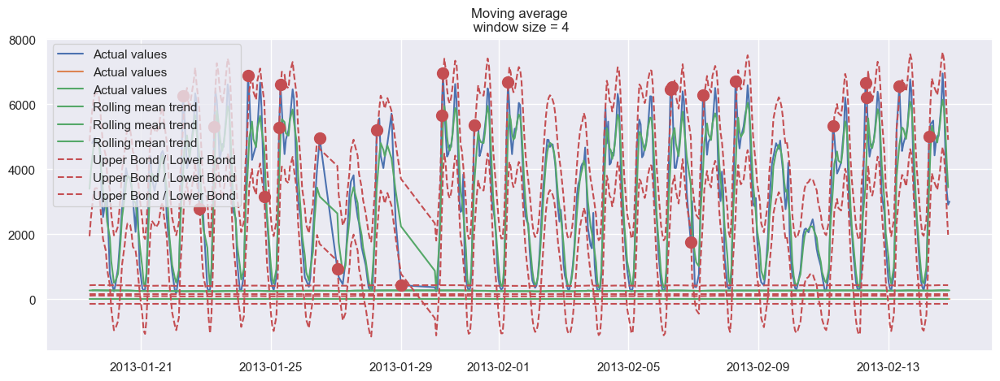

In [32]:
# 4 кодичество наших усреднений , наше окно
# значения, которые не входят в доверительный интервал - кружки

plotMovingAverage(df[2500:3000], 4, plot_intervals=True, plot_anomalies=True)

Вывод: Большой шум. Актуальные значения отдалены от прогнозных

- Экспоненциальное сглаживание — это метод прогнозирования временных рядов, который использует взвешенное среднее прошлых наблюдений с убывающим весом. Это означает, что более старые наблюдения имеют меньший вес, чем более новые наблюдения.
- Экспоненциальное сглаживание обычно используется, когда данные имеют тенденцию к увеличению или уменьшению со временем. В этом случае, более старые наблюдения обычно менее актуальны, и вес их уменьшается по мере увеличения возраста наблюдения.
- В формуле экспоненциального сглаживания используется экспоненциальный сглаживающий коэффициент α, который определяет степень убывания веса старых наблюдений. Коэффициент α обычно выбирается таким образом, чтобы все веса были меньше 1, чтобы обеспечить стабильность и сходимость прогнозов.
- Формула Smoothed_Value = α * Current_Observation + (1 - α) * Previous_Smoothed_Value


In [33]:
def exponential_smoothing(series, alpha):
    """
    :param series: dataset with timestamps
    :param alpha:  float [0.0, 1.0], smoothing parameter
    """
    result = [series[0]] # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

def plotExponentialSmoothing(series, alphas):
    """
    :param series:  dataset with timestamps
    :param alphas:  list of floats, smoothing parameters
    """
    with plt.style.context('seaborn-white'):    
        plt.figure(figsize=(15, 7))
        plt.plot(series.values, "c", label = "Actual")
        for alpha in alphas:
            plt.plot(exponential_smoothing(series, alpha), label="Alpha {}".format(alpha))
        plt.legend(loc="best")
        plt.axis('tight')
        plt.title("Exponential Smoothing")
        plt.grid(True)

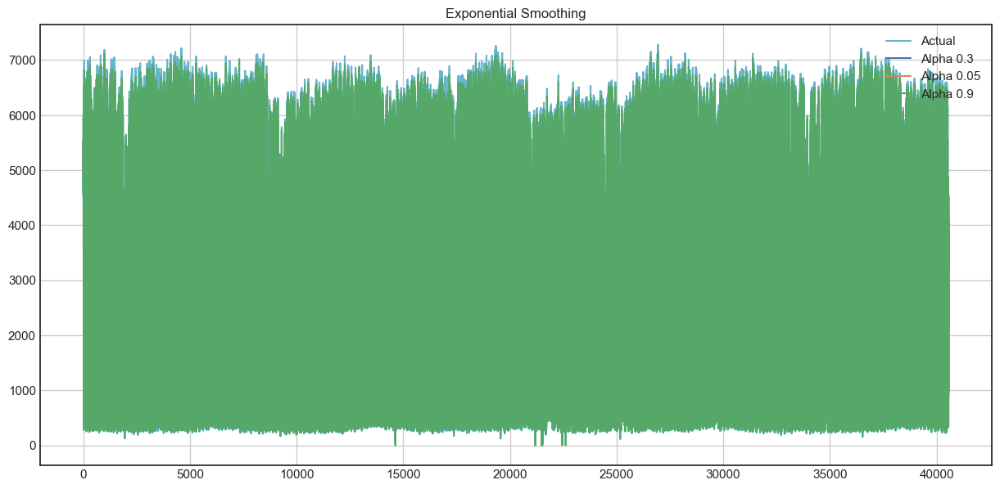

In [34]:
plotExponentialSmoothing(df.traffic_volume, [0.3, 0.05, 0.9])

Вывод: пока не понятно, идем дальше

#### Двойное экспоненциальное сглаживание

- Двойное экспоненциальное сглаживание — это метод прогнозирования временных рядов, который использует взвешенное среднее прошлых наблюдений с убывающим весом. Он работает так же, как и обычное экспоненциальное сглаживание, но использует два параметра, α и β, для управления скоростью сглаживания.
- Параметр α контролирует скорость сглаживания: чем больше α, тем быстрее сглаживание. Параметр β определяет, сколько процентов прогноза следующего наблюдения будет основываться на текущем прогнозе, а сколько процентов — на текущем наблюдении.
- Формула двойного экспоненциального сглаживания выглядит следующим образом:

- Level = (1 - α) * Level + α * (Previous_Level + (Current_Observation - Previous_Level))
Trend = (1 - β) * Trend + β * (Level - Previous_Level)
Adjusted_Level = Level + Trend


In [35]:
def double_exponential_smoothing(series, alpha, beta):
    """
    :param series:  dataset with timeseries
    :param alpha:   float [0.0, 1.0], smoothing parameter for level
    :param beta:    float [0.0, 1.0], smoothing parameter for trend
    """
    # first value is same as series
    result = [series[0]]
    for n in range(1, len(series)+1):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        # forecasting
        if n >= len(series):
            value = result[-1]
        else:
            value = series[n]
        last_level = level
        level = alpha*value + (1-alpha)*(level+trend)
        trend = beta*(level-last_level) + (1-beta)*trend
        result.append(level+trend)
    return result

def plotDoubleExponentialSmoothing(series, alphas, betas):
    """
    :param series:  dataset with timestamps
    :param alphas:  list of floats, smoothing parameters for level
    :param betas:   list of floats, smoothing parameters for trend
    """
    with plt.style.context('seaborn-white'):    
        plt.figure(figsize=(20, 8))
        plt.plot(series.values, label = "Actual")
        for alpha in alphas:
            for beta in betas:
                plt.plot(double_exponential_smoothing(series, alpha, beta), label="Alpha {}, beta {}".format(alpha, beta))
        plt.legend(loc="best")
        plt.axis('tight')
        plt.title("Double Exponential Smoothing")
        plt.grid(True)

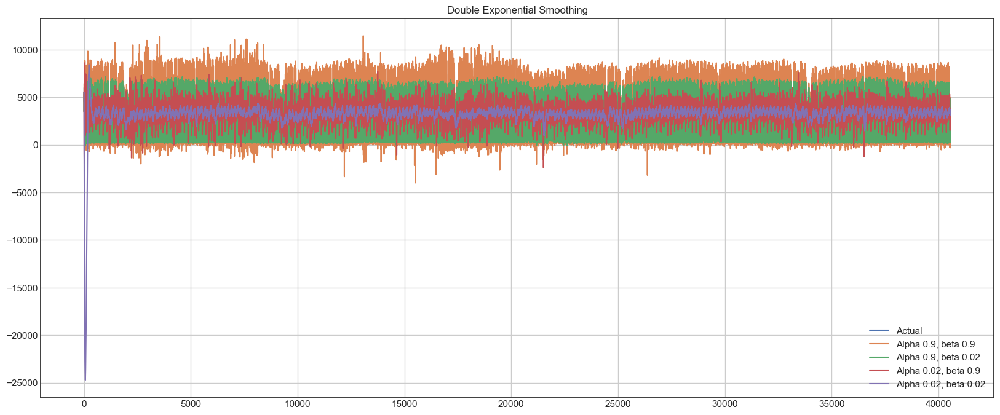

In [36]:
plotDoubleExponentialSmoothing(df.traffic_volume, alphas=[0.9, 0.02], betas=[0.9, 0.02])

Вывод: уровень тренда бетта и альфа  - не влияет на актуальное значение 0.02

#### 2.1 Анализ наблюдений во временном ряду, исходя из графиков, трендов 

 > - У нас в 2015 не было данных, поэтому его можно выкинуть, но, это только предположение.
 - Анализируем наблюдения  во временном ряду, исходя из графиков
 - Предположим, какие исторические данные действительно будут релевантны для прогнозов текущих значений.

#### Авторегрессия

Модель AR (Autoregressive) в контексте временных рядов - это модель, которая использует прошлые значения временного ряда для прогнозирования будущих значений. 

Вот как это работает:

1. Выбираем определенное количество прошлых значений (обычно называемых "параметром p").

2. Затем вычисляем среднее или другой статистический показатель этих прошлых значений.

3. Это среднее значение или статистика используется для прогнозирования следующего значения в ряду.

Например, если у нас есть временной ряд `[1, 2, 3, 4, 5]` и мы выберете `p=2`, то для прогнозирования следующего значения мы бы взяли среднее значение последних двух значений (то есть `(4+5)/2 = 4.5`), и предположили, что следующее значение будет близко к этому среднему значению.

Теоритическая справка:
- Модель MA (Moving Average) в контексте временных рядов - это модель, которая использует среднее значение прошлых ошибок для прогнозирования будущих значений.
Вот как это работает:
1. Выбираем определенное количество прошлых ошибок (обычно называемых "параметром q").
2. Затем вычисляем среднее значение этих прошлых ошибок.
3. Это среднее значение или статистика используется для прогнозирования следующего значения в ряду.
- Например, если у нас есть временной ряд `[1, 2, 3, 4, 5]` и мы выберете `q=2`, то для прогнозирования следующего значения мы бы взяли среднее значение последних двух ошибок (то есть `error[1] + error[2] / 2`), и предположили, что следующее значение будет близко к этому среднему значению.

- Модель ARMA (AutoRegressive Moving Average) в контексте временных рядов - это модель, которая использует как прошлые значения самого временного ряда (AR - AutoRegressive), так и среднее значение прошлых ошибок (MA - Moving Average) для прогнозирования будущих значений.
Вот как это работает:
- 1. Выбираем определенное количество прошлых значений временного ряда (обычно называемых "параметром p" в части AR) и прошлых ошибок (обычно называемых "параметром q" в части MA).
2. Затем мы вычисляем среднее значение этих прошлых значений и ошибок.
3. Это среднее значение или статистика используется для прогнозирования следующего значения в ряду.
- Например, если у нас есть временной ряд `[1, 2, 3, 4, 5]` и мы выберете `p=2` и `q=2`, то для прогнозирования следующего значения мы бы взяли среднее значение последних двух значений (то есть `(4+5)/2 = 4.5`) и среднее значение последних двух ошибок (то есть `error[1] + error[2] / 2`), и предположили, что следующее значение будет близко к этому среднему значению.

- Модель ARIMA (AutoRegressive Integrated Moving Average) в контексте временных рядов - это модель, которая использует как прошлые значения самого временного ряда (AR - AutoRegressive), так и среднее значение прошлых ошибок (MA - Moving Average), а также может учесть тренд в данных (I - Integrated).
Вот как это работает:
1. Выбираем определенное количество прошлых значений временного ряда (обычно называемых "параметром p" в части AR), прошлых ошибок (обычно называемых "параметром q" в части MA) и используете "параметр d" для учета тренда.
2. Затем вычисляем среднее значение этих прошлых значений и ошибок.
3. Это среднее значение или статистика используется для прогнозирования следующего значения в ряду.
- Например, если у нас есть временной ряд `[1, 2, 3, 4, 5]` и мы выберете `p=2`, `q=2` и `d=1`, то для прогнозирования следующего значения мы бы взяли среднее значение последних двух значений (то есть `(4+5)/2 = 4.5`) и среднее значение последних двух ошибок (то есть `error[1] + error[2] / 2`), и предположили, что следующее значение будет близко к этому среднему значению.

 > Построим график автокорреляционной функции (ACF) для выбранного столбца данных.
 - ACF показывает, насколько сильно коррелируют значения временного ряда с его предыдущими значениями с разными лагами.
 - Это помогает определить, есть ли в данных зависимость от прошлого и какой порядок авторегрессии (p) использовать для модели ARIMA в дальнейшем.

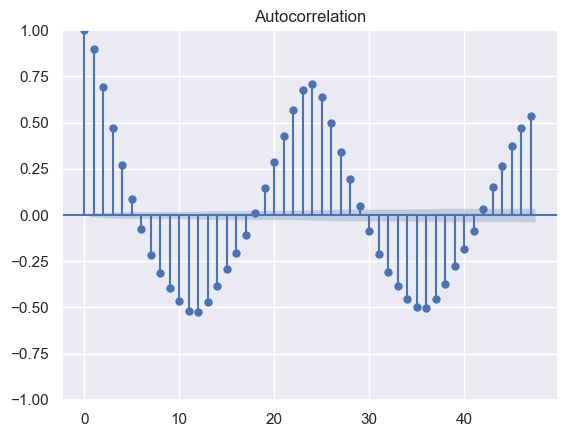

In [37]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Выбор столбца для анализа
series = df['traffic_volume']

# Построение автокорреляционной функции
plot_acf(series)
plt.show()


Строим график автокорреляционной функции для столбца ‘traffic_volume’ в нашем датафрейме. 
Если мы видиме, что корреляция уменьшается с увеличением лага, это может указывать на то, что более старые данные менее связаны с более новыми данными, и их можно удалить.

Строим графики ACF и PACF

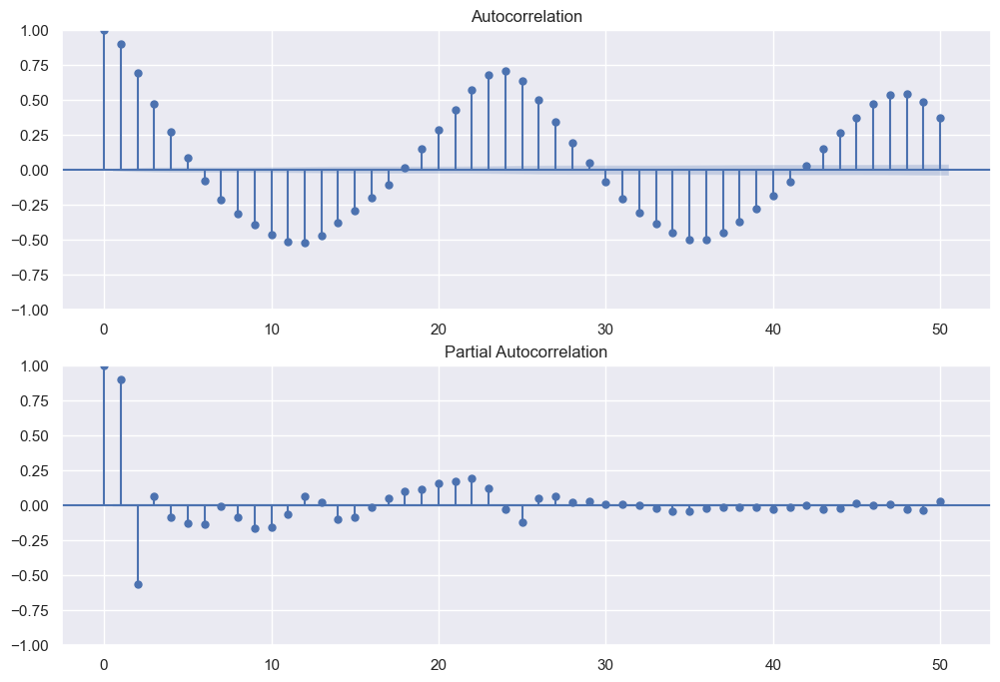

In [38]:
# Строим графики ACF и PACF
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, ax = plt.subplots(2, 1, figsize=(12, 8))
plot_acf(df['traffic_volume'], lags=50, ax=ax[0])
plot_pacf(df['traffic_volume'], lags=50, ax=ax[1])
plt.show()

- Теоритическая справка:
- Автокорреляционная функция (ACF) и частичная автокорреляционная функция (PACF) - это два ключевых метода анализа временных рядов, которые используются для изучения зависимостей между значениями временного ряда.
- Автокорреляционная функция (ACF): ACF измеряет, насколько сильно текущее значение временного ряда коррелирует с его предыдущими значениями. ACF обычно строится для различных задержек (так называемых "лагов"), и график ACF показывает, как эта корреляция меняется с задержкой. Если ACF быстро убывает, это может указывать на наличие сезонности в данных.
- Частичная автокорреляционная функция (PACF): PACF, в отличие от ACF, учитывает только один предыдущий период при вычислении корреляции. Это делает PACF более полезным для определения модели временного ряда, поскольку она позволяет выбрать модель, которая наилучшим образом описывает данные, игнорируя возможные зависимости от более ранних периодов.

Вывод:
- Графики автокорреляционной функции (ACF) и частичной автокорреляционной функции (PACF) предоставляют ценные сведения о временном ряду.
- График ACF показывает, как текущее значение временного ряда связано с его предыдущими значениями. Если график быстро убывает, это может указывать на наличие сезонности в данных. В данном случае, график ACF показывает, что существуют заметные автокорреляции на коротких временных интервалах, что может указывать на сезонность или цикличность в данных.
- График PACF показывает, как текущее значение временного ряда связано с его предыдущими значениями, игнорируя возможные зависимости от более ранних периодов. Это может быть полезно при выборе модели временного ряда. В данном случае, график PACF показывает, что большинство значимых зависимостей происходят на коротких временных интервалах.
- Таким образом, исходя из этих графиков, можно предположить, что предыдущие три года могут быть недостаточно релевантны для прогнозов текущих значений. 

#### 2.2 Построения графиков анализа временных рядов

In [39]:
# Импорт библиотеки statsmodels для работы со статистическими моделями
import statsmodels.api as sm
# Импорт модуля statsmodels.tsa для работы с временными рядами
import statsmodels.tsa.api as smt


In [40]:
# Импорт функций для построения графиков ACF и PACF
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Определение функции для построения графиков анализа временных рядов
def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    """
    Plot time series, its ACF and PACF, calculate Dickey–Fuller test
    :param y:     Timeseries
    :param lags:  How many lags to include in ACF, PACF calculation
    """
    # Проверка типа данных, если не серия pandas, то преобразовать в серию
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    # Установка стиля графиков
    with plt.style.context(style):    
        # Создание фигуры с заданным размером
        fig = plt.figure(figsize=figsize)
        # Определение расположения подграфиков в сетке 2 на 2
        layout = (2, 2)
        # Создание подграфика для временного ряда, занимающего две колонки
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        # Создание подграфика для ACF
        acf_ax = plt.subplot2grid(layout, (1, 0))
        # Создание подграфика для PACF
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        
        # Построение временного ряда
        y.plot(ax=ts_ax)
        # Расчет статистики Дики-Фуллера и p-значения для проверки стационарности ряда
        # Нулевая гипотеза - ряд нестационарен, альтернативная - ряд стационарен
        # Если p-значение меньше уровня значимости (например, 0.05), то отвергаем нулевую гипотезу
        p_value = sm.tsa.stattools.adfuller(y)[1]
        # Добавление заголовка с p-значением
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        # Построение ACF для ряда с заданным количеством лагов
        # ACF показывает, насколько сильно коррелируют значения ряда с его предыдущими значениями с разными лагами
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        # Построение PACF для ряда с заданным количеством лагов и методом оценки
        # PACF показывает, насколько сильно коррелируют значения ряда с его предыдущими значениями с разными лагами, исключая влияние промежуточных лагов
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, method="ols")
        # Автоматическая подгонка размеров графиков
        plt.tight_layout()


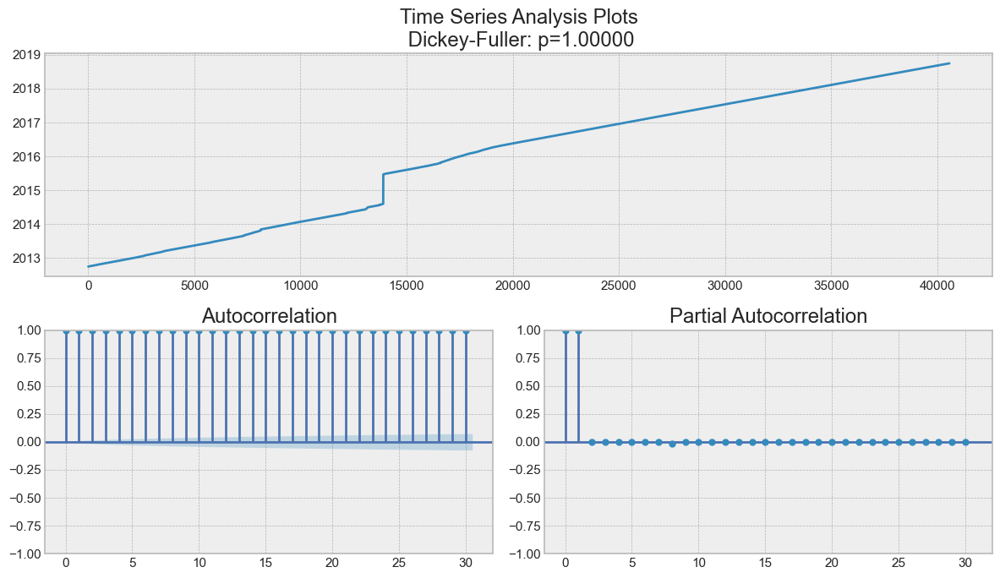

In [41]:
# Вот на этом графике показано - что три года (2013, 2014, 2015) не релевантны
tsplot(df.index, lags=30)

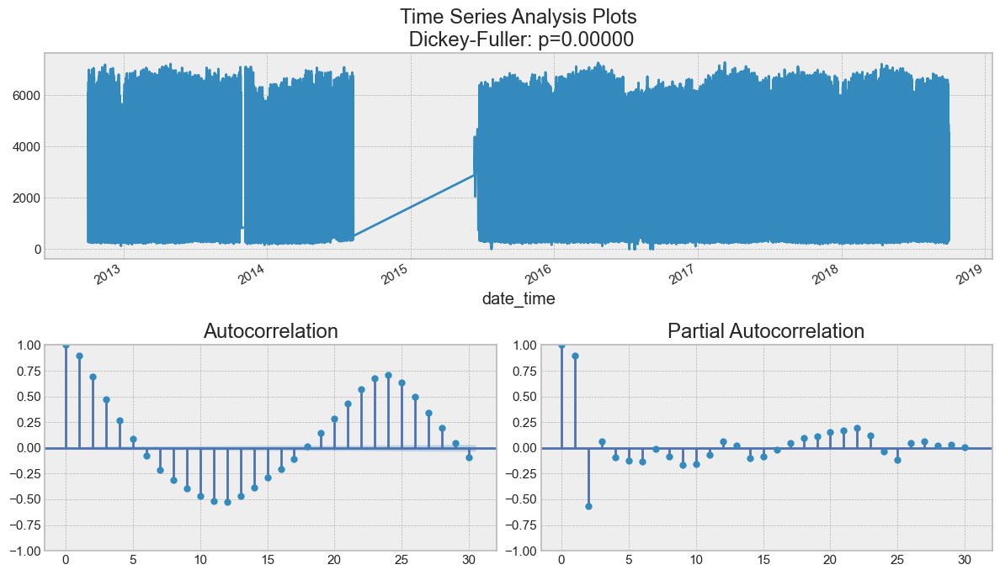

In [42]:
# Вот на этом графике показано - что три года (2013, 2014, 2015) не релевантны
tsplot(df['traffic_volume'], lags=30)


##### 3. Отложим последние две недели в датасете для тестирования нашей модели - на этих данных мы будем проверять финальное качество всех моделек.

In [43]:
df.head()

,traffic_volume,holiday,temp
date_time,,,
2012-10-02 09:00:00,5545,11,288.28
2012-10-02 10:00:00,4516,11,289.36
2012-10-02 11:00:00,4767,11,289.58
2012-10-02 12:00:00,5026,11,290.13
2012-10-02 13:00:00,4918,11,291.14


In [44]:
df.shape

(40575, 3)

In [45]:
# Видим 23 часа
print(df.index)

DatetimeIndex(['2012-10-02 09:00:00', '2012-10-02 10:00:00',
               '2012-10-02 11:00:00', '2012-10-02 12:00:00',
               '2012-10-02 13:00:00', '2012-10-02 14:00:00',
               '2012-10-02 15:00:00', '2012-10-02 16:00:00',
               '2012-10-02 17:00:00', '2012-10-02 18:00:00',
               ...
               '2018-09-30 14:00:00', '2018-09-30 15:00:00',
               '2018-09-30 16:00:00', '2018-09-30 17:00:00',
               '2018-09-30 18:00:00', '2018-09-30 19:00:00',
               '2018-09-30 20:00:00', '2018-09-30 21:00:00',
               '2018-09-30 22:00:00', '2018-09-30 23:00:00'],
              dtype='datetime64[ns]', name='date_time', length=40575, freq=None)


- Изменение параметра test_size, чтобы он соответствовал двум неделям 23 часам из датасета
- Посчитаем, какая часть датафрейма соответствует двум неделям 23 часам. Для этого нужно поделить количество часов в двух неделях 23 часах на общее количество часов в твоем датасете. То есть:

- 244072×24×7+23​≈0.0239

In [46]:
# Определение функции create_lags, которая создает лаговые признаки из нескольких столбцов с временными рядами
# Лаговые признаки - это значения временного ряда, сдвинутые на определенное количество шагов назад
# Они используются для учета зависимости между текущим и предыдущими значениями временного ряда
def create_lags(df, series_columns, start_lag, end_lag):
    # Создание копии исходного датафрейма
    data = df.copy()
    # Цикл по списку столбцов с временными рядами
    for c in series_columns:
        # Цикл по диапазону лагов от начального до конечного не включительно
        for i in range(start_lag, end_lag):
            # Добавление столбца с лагом в датафрейм, используя метод shift для сдвига столбца c на i позиций назад
            # Формирование названия столбца с лагом в формате "lag_столбец_лаг"
            data["lag_{}_{}".format(c, i)] = data[c].shift(i)
    # Возвращение датафрейма с лаговыми признаками
    return data


# Определение функции timeseries_train_test_split, которая разделяет данные на обучающую и тестовую выборки с учетом структуры
# временных рядов
# Эта функция нужна, потому что обычный метод train_test_split из библиотеки sklearn не подходит для временных рядов, так как он перемешивает данные
# Для временных рядов важно сохранить хронологический порядок данных и не использовать будущие значения для обучения модели
def timeseries_train_test_split(y, X=None, test_size=0.0239):
    """
    Performs train-test split with respect to time series structure
    :param X:         x data
    :type X:           pd.DataFrame
    :param y:         y data
    :type y:           pd.Series
    :param test_size: percent of test data from the end of series (0-1)
    :type test_size:   float
    """
    # Определение индекса, по которому будет производиться разделение данных
    # Используется длина серии y и параметр test_size, который задает долю тестовых данных от конца ряда
    test_index = int(len(y)*(1-test_size))
    
    # Проверка, задан ли параметр X
    if X is None:
        # Если нет, то разделение производится только по серии y
        # Используется метод iloc для выбора подмножества данных по индексам
        # Обучающая выборка - все данные до индекса test_index
        y_train = y.iloc[:test_index]
        # Тестовая выборка - все данные от индекса test_index до конца
        y_test = y.iloc[test_index:]
        # Возвращение обучающей и тестовой выборки для y
        return y_train, y_test
    else:
        # Если да, то разделение производится по датафрейму X и серии y
        # Используется метод iloc для выбора подмножества данных по индексам
        # Обучающая выборка - все данные до индекса test_index
        X_train = X.iloc[:test_index]
        y_train = y.iloc[:test_index]
        # Тестовая выборка - все данные от индекса test_index до конца
        X_test = X.iloc[test_index:]
        y_test = y.iloc[test_index:]
        # Возвращение обучающей и тестовой выборки для X и y
        return X_train, X_test, y_train, y_test


In [47]:
# Вызываем функцию create_lags, которая создает лаговые признаки из столбца x
# Передаем в функцию датафрейм df, список столбцов с временными рядами ["x"], начальный лаг 1 и конечный лаг 60
# Получаем новый датафрейм data с лаговыми признаками
data = create_lags(df=df, series_columns=["traffic_volume"], start_lag=1, end_lag=60)

# Выбираем целевую переменную y, которая равна столбцу x
# Используем метод dropna() для удаления строк с пропущенными значениями, которые могли появиться из-за сдвига столбцов
y = data.dropna()["traffic_volume"]

# Выбираем матрицу признаков X, которая равна всем столбцам датафрейма data, кроме x
# Используем метод drop() для удаления столбца x по оси 1 (столбцы)
X = data.dropna().drop(["traffic_volume"], axis=1)

# Вызываем функцию timeseries_train_test_split, которая разделяет данные на обучающую и тестовую выборки с учетом структуры временных рядов
# Передаем в функцию целевую переменную y, матрицу признаков X и параметр test_size, который задает долю тестовых данных (0.3 или 30%)
# Получаем четыре объекта: X_train, X_test, y_train, y_test
X_train, X_test, y_train, y_test = timeseries_train_test_split(y, X, test_size=0.3)


In [48]:
data.head()

,traffic_volume,holiday,temp,lag_traffic_volume_1,lag_traffic_volume_2,lag_traffic_volume_3,lag_traffic_volume_4,lag_traffic_volume_5,lag_traffic_volume_6,lag_traffic_volume_7,...,lag_traffic_volume_50,lag_traffic_volume_51,lag_traffic_volume_52,lag_traffic_volume_53,lag_traffic_volume_54,lag_traffic_volume_55,lag_traffic_volume_56,lag_traffic_volume_57,lag_traffic_volume_58,lag_traffic_volume_59
date_time,,,,,,,,,,,,,,,,,,,,,
2012-10-02 09:00:00,5545,11,288.28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-10-02 10:00:00,4516,11,289.36,5545.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-10-02 11:00:00,4767,11,289.58,4516.0,5545.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-10-02 12:00:00,5026,11,290.13,4767.0,4516.0,5545.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-10-02 13:00:00,4918,11,291.14,5026.0,4767.0,4516.0,5545.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [49]:
data.shape

(40575, 62)

In [50]:
# Выводим размеры обучающей и тестовой выборки
# Каждый размер представляет собой кортеж из двух элементов: количество наблюдений и количество признаков
# X_train.shape - размер матрицы признаков для обучения модели
# X_test.shape - размер матрицы признаков для тестирования модели
# y_train.shape - размер вектора целевой переменной для обучения модели
# y_test.shape - размер вектора целевой переменной для тестирования модели
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((28361, 61), (12155, 61), (28361,), (12155,))

In [51]:
# Выводим первые шесть строк матрицы признаков для обучения модели
# Используем метод head() для выбора подмножества данных по индексам
# Передаем в метод параметр 6, который задает количество строк для вывода
# X_train - это объект pandas.DataFrame, который содержит признаки для обучения модели
X_train.head(6)

,holiday,temp,lag_traffic_volume_1,lag_traffic_volume_2,lag_traffic_volume_3,lag_traffic_volume_4,lag_traffic_volume_5,lag_traffic_volume_6,lag_traffic_volume_7,lag_traffic_volume_8,...,lag_traffic_volume_50,lag_traffic_volume_51,lag_traffic_volume_52,lag_traffic_volume_53,lag_traffic_volume_54,lag_traffic_volume_55,lag_traffic_volume_56,lag_traffic_volume_57,lag_traffic_volume_58,lag_traffic_volume_59
date_time,,,,,,,,,,,,,,,,,,,,,
2012-10-05 00:00:00,11,290.63,1166.0,1992.0,2822.0,3037.0,3503.0,4907.0,6057.0,6292.0,...,4770.0,5791.0,6015.0,5584.0,5181.0,4918.0,5026.0,4767.0,4516.0,5545.0
2012-10-05 01:00:00,11,290.46,627.0,1166.0,1992.0,2822.0,3037.0,3503.0,4907.0,6057.0,...,3539.0,4770.0,5791.0,6015.0,5584.0,5181.0,4918.0,5026.0,4767.0,4516.0
2012-10-05 03:00:00,11,289.26,388.0,627.0,1166.0,1992.0,2822.0,3037.0,3503.0,4907.0,...,2784.0,3539.0,4770.0,5791.0,6015.0,5584.0,5181.0,4918.0,5026.0,4767.0
2012-10-05 05:00:00,11,283.21,368.0,388.0,627.0,1166.0,1992.0,2822.0,3037.0,3503.0,...,2361.0,2784.0,3539.0,4770.0,5791.0,6015.0,5584.0,5181.0,4918.0,5026.0
2012-10-05 06:00:00,11,282.24,2489.0,368.0,388.0,627.0,1166.0,1992.0,2822.0,3037.0,...,1529.0,2361.0,2784.0,3539.0,4770.0,5791.0,6015.0,5584.0,5181.0,4918.0
2012-10-05 07:00:00,11,281.69,5537.0,2489.0,368.0,388.0,627.0,1166.0,1992.0,2822.0,...,963.0,1529.0,2361.0,2784.0,3539.0,4770.0,5791.0,6015.0,5584.0,5181.0


In [52]:
# Выводим первые три строки вектора целевой переменной для обучения модели
# Используем метод head() для выбора подмножества данных по индексам
# Передаем в метод параметр 3, который задает количество строк для вывода
# y_train - это объект pandas.Series, который содержит значения целевой переменной для обучения модели
y_train.head(3)

date_time
2012-10-05 00:00:00    627
2012-10-05 01:00:00    388
2012-10-05 03:00:00    368
Name: traffic_volume, dtype: int64

In [53]:
# Импорт класса LinearRegression из библиотеки sklearn.linear_model
from sklearn.linear_model import LinearRegression

# Создание объекта класса LinearRegression, который представляет модель линейной регрессии
lr = LinearRegression()

# Обучение модели на обучающей выборке, используя метод fit
# Передача в метод матрицы признаков X_train и вектора целевой переменной y_train
lr.fit(X_train, y_train)

LinearRegression()

- Cтроим графики для сравнения фактических и прогнозируемых значений, интервалов прогноза и аномалий. 

In [54]:
# Определение функции для построения графиков, которая принимает модель, обучающую и тестовую выборки, и параметры 
# для включения разных элементов на графике
def plotModelResults(model, X_train, y_train, X_test, y_test,
                     plot_train=False, plot_intervals=False, plot_anomalies=False):
    """
    Plots modelled vs fact values, prediction intervals and anomalies
    """
    # Создание объекта класса TimeSeriesSplit, который разбивает данные на несколько временных подмножеств для кросс-валидации
    # Передача в конструктор класса количества разбиений n_splits, равного 5
    tscv = TimeSeriesSplit(n_splits=5)
    # Получение прогнозных значений целевой переменной на тестовой выборке, используя метод predict модели
    prediction = model.predict(X_test)
    
    # Определение длины обучающей и тестовой выборки
    N_train = len(y_train)
    N_test = len(y_test)
    # Определение диапазонов индексов для обучающей и тестовой выборки
    train_index = range(N_train)
    test_index = range(N_train, N_train+N_test)
    
    # Создание фигуры с заданным размером, используя функцию figure из библиотеки matplotlib.pyplot
    plt.figure(figsize=(15, 7))
    # Проверка, нужно ли включать на графике фактические значения обучающей выборки
    if plot_train:
        # Если да, то построение линии с фактическими значениями обучающей выборки, 
        # используя функцию plot из библиотеки matplotlib.pyplot
        # Передача в функцию диапазона индексов обучающей выборки, значений целевой переменной обучающей выборки и метки "train actual"
        plt.plot(train_index, y_train.values, label="train actual")
    # Построение линии с фактическими значениями тестовой выборки, используя функцию plot из библиотеки matplotlib.pyplot
    # Передача в функцию диапазона индексов тестовой выборки, значений целевой переменной тестовой выборки,
    # метки "actual" и толщины линии 2.0
    plt.plot(test_index, y_test.values, label="actual", linewidth=2.0)
    # Построение линии с прогнозными значениями тестовой выборки, используя функцию plot из библиотеки matplotlib.pyplot
    # Передача в функцию диапазона индексов тестовой выборки, прогнозных значений целевой переменной тестовой выборки,
    # метки "prediction", цвета "g" и толщины линии 2.0
    plt.plot(test_index, prediction, "g", label="prediction", linewidth=2.0)
    
    # Проверка, нужно ли включать на графике интервалы прогноза
    if plot_intervals:
        # Если да, то вычисление средней абсолютной ошибки и стандартного отклонения ошибки на обучающей выборке,
        # используя функцию cross_val_score из библиотеки sklearn.model_selection
        # Передача в функцию модели, матрицы признаков обучающей выборки, вектора целевой переменной обучающей выборки, 
        # объекта для кросс-валидации tscv и метрики "neg_mean_absolute_error"
        cv = cross_val_score(model, X_train, y_train, cv=tscv, scoring="neg_mean_absolute_error")
        # Умножение среднего значения ошибки на -1, так как метрика "neg_mean_absolute_error" возвращает отрицательные значения
        mae = cv.mean() * (-1)
        # Вычисление стандартного отклонения ошибки
        deviation = cv.std()
        
        # Определение коэффициента масштаба для интервалов прогноза, равного 1.96
        scale = 1.96
        # Вычисление нижней и верхней границы интервалов прогноза, используя формулу: 
        # прогноз +/- (средняя ошибка + коэффициент масштаба * стандартное отклонение ошибки)
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)
        
        # Построение пунктирных линий с нижней и верхней границами интервалов прогноза, 
        # используя функцию plot из библиотеки matplotlib.pyplot
        # Передача в функцию диапазона индексов тестовой выборки, значений нижней и верхней границы, 
        # метки "upper bond / lower bond", цвета "r", стиля "--" и прозрачности 0.5
        plt.plot(test_index, lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(test_index, upper, "r--", alpha=0.5)
        
        # Проверка, нужно ли включать на графике аномалии
        if plot_anomalies:
            # Если да, то создание массива с пропущенными значениями, длиной равной длине тестовой выборки,
            # используя функцию array из библиотеки numpy
            anomalies = np.array([np.NaN]*len(y_test))
            # Замена пропущенных значений на фактические значения тестовой выборки, если они выходят за пределы интервалов прогноза,
            # используя булеву индексацию
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            # Построение точек с аномальными значениями, используя функцию plot из библиотеки matplotlib.pyplot
            # Передача в функцию диапазона индексов тестовой выборки, значений аномалий, 
            # метки "Anomalies", маркера "o" и размера маркера 10
            plt.plot(test_index, anomalies, "o", markersize=10, label = "Anomalies")
    
    # Вычисление средней процентной ошибки между прогнозными и фактическими значениями тестовой выборки, 
    # используя функцию mean_absolute_percentage_error
    error = mean_absolute_percentage_error(prediction, y_test)
    # Добавление заголовка к графику с значением средней процентной ошибки, используя функцию title из библиотеки matplotlib.pyplot
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    # Добавление легенды к графику с метками элементов, используя функцию legend из библиотеки matplotlib.pyplot
    plt.legend(loc="best")
    # Автоматическое подгонка графика к размеру фигуры, используя функцию tight_layout из библиотеки matplotlib.pyplot
    plt.tight_layout()
    # Добавление сетки к графику, используя функцию grid

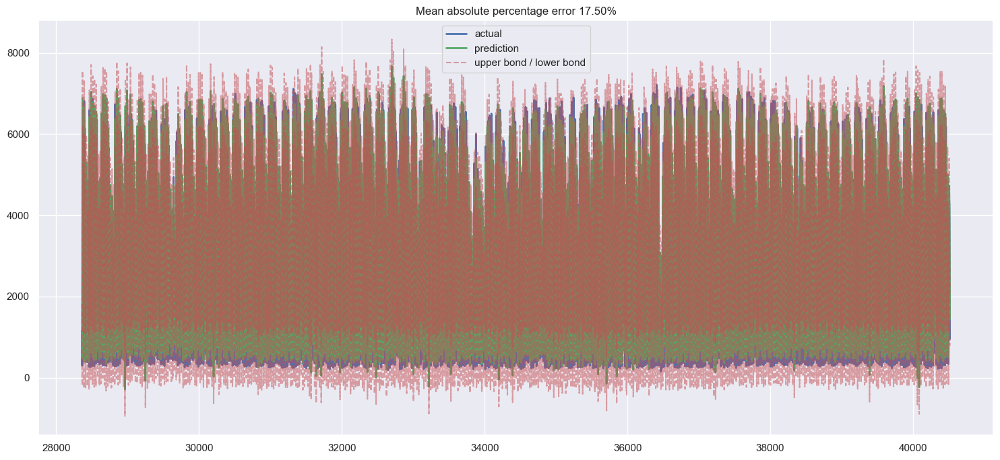

In [55]:
# Строим графики для сравнения фактических и прогнозируемых значений, интервалов прогноза и аномалий. 
# Вызоваем функции plotModelResults, которая принимает модель, обучающую и тестовую выборки, и параметры для включения
# разных элементов на графике

plotModelResults(lr, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, plot_intervals=True)

# Передаем в функцию объекта модели линейной регрессии lr, матрицу признаков обучающей и тестовой выборки X_train и X_test, 
# векторов целевой переменной обучающей и тестовой выборки y_train и y_test
# Устанавливаем параметры plot_intervals в True, чтобы включить на графике интервалы прогноза
# Остальные параметры plot_train и plot_anomalies оставляем по умолчанию в False, чтобы не включать на графике фактические значения
# обучающей выборки и аномалии

 ##### Строим рекурсивный прогноз и строит графики для сравнения фактических и прогнозируемых значений. Это интересная и сложная задача для анализа данных.

In [56]:
# Определение функции для рекурсивного прогноза, которая принимает модель и датафрейм с признаками для прогноза
def recursive_predict(model, df_forecast):
    # Определение горизонта прогноза, равного длине датафрейма
    horizon = len(df_forecast)
    
    # Создание копии датафрейма, в которой будут храниться прогнозные значения
    df_pred = df_forecast.copy()
    # Заполнение пропущенными значениями всех строк, кроме первой, в копии датафрейма, используя метод iloc
    df_pred.iloc[1:] = np.nan
    
    # Создание пустого списка, в котором будут храниться прогнозные значения
    forecast = []
    
    # Цикл по диапазону от 0 до горизонта прогноза
    for i in range(horizon):
        # Получение следующего прогнозного значения, используя метод predict модели
        # Передача в метод среза копии датафрейма, соответствующего i-й строке, и извлечение нулевого элемента из результата
        next_x = model.predict(df_pred.iloc[[i], :])[0]
        # Добавление следующего прогнозного значения в список
        forecast.append(next_x)
        # Проверка, не достигнут ли конец горизонта прогноза
        if i < horizon-1:
            # Если нет, то обновление копии датафрейма, используя следующее прогнозное значение и предыдущие значения признаков
            # Присваивание следующего прогнозного значения i+1-му элементу нулевого столбца копии датафрейма
            df_pred.iloc[i+1,0] = next_x
            # Присваивание значений признаков i-й строки копии датафрейма значениям признаков i+1-й строки, сдвинутым на одну позицию вправо
            df_pred.iloc[[i+1],1:] = df_pred.iloc[i,:-1].values
    
    # Возвращение массива с прогнозными значениями, используя функцию array из библиотеки numpy
    return np.array(forecast)


# Определение функции для построения графиков, которая принимает модель, тестовую выборку с признаками и целевой переменной
def plotRecursivePrediction(model, X_test, y_test):
    # Получение прогнозных значений, используя функцию recursive_predict
    prediction = recursive_predict(model, X_test)
    
    # Создание фигуры с заданным размером, используя функцию figure из библиотеки matplotlib.pyplot
    plt.figure(figsize=(15, 7))
    
    # Вычисление средней процентной ошибки между прогнозными и фактическими значениями тестовой выборки, используя функцию mean_absolute_percentage_error
    error = mean_absolute_percentage_error(prediction, y_test.values)
    # Добавление заголовка к графику с значением средней процентной ошибки, используя функцию title из библиотеки matplotlib.pyplot
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    
    # Построение линии с фактическими значениями тестовой выборки, используя функцию plot из библиотеки matplotlib.pyplot
    # Передача в функцию значений целевой переменной тестовой выборки, метки "actual" и толщины линии 2.0
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    # Построение линии с прогнозными значениями тестовой выборки, используя функцию plot из библиотеки matplotlib.pyplot
    # Передача в функцию прогнозных значений целевой переменной тестовой выборки, метки "prediction", цвета "g" и толщины линии 2.0
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    # Добавление легенды к графику с метками элементов, используя функцию legend из библиотеки matplotlib.pyplot
    plt.legend(loc="best")
    # Автоматическое подгонка графика к размеру фигуры, используя функцию tight_layout из библиотеки matplotlib.pyplot
    plt.tight_layout()
    # Добавление сетки к графику, используя функцию grid
    plt.grid(True)


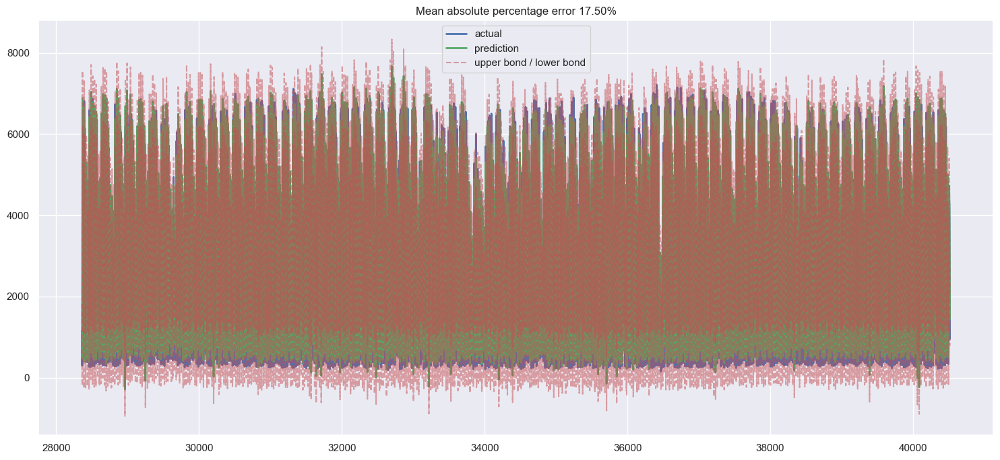

In [57]:
 def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Cтроим график для сравнения фактических и прогнозируемых значений, используя линейную регрессию

# Создание объекта класса LinearRegression, который назначается переменной lr
lr = LinearRegression()

# Обучение модели на обучающей выборке, используя метод fit
# Передача в метод матрицы признаков обучающей выборки X_train и вектора целевой переменной обучающей выборки y_train
lr.fit(X_train, y_train)

# Вызов функции plotModelResults, которая принимает модель, обучающую и тестовую выборки с признаками и целевой переменной
# и строит графики
# Передача в функцию объекта модели lr, матриц признаков обучающей и тестовой выборки X_train и X_test, векторов целевой 
# переменной обучающей и тестовой выборки y_train и y_test и параметра plot_intervals, равного True, который включает 
# на графике интервалы прогноза
plotModelResults(lr, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, plot_intervals=True)



- Ошибка составляет 18 %, что указывает на то, что модель в среднем прогнозирует значения, которые отличаются от истинных значений на 18 %.
- Это низкий показатель ошибки, что говорит о том, что наша модель не очень хорошо работает. 
- Однако всегда стоит учитывать контекст и специфику задачи. Если наши данные содержат большие значения, то даже небольшая ошибка может иметь большое значение. Также стоит учитывать, что модель может быть не такая хороша на определенных частях данных, поэтому всегда полезно проводить дополнительную диагностику и проверку модели.

 - Теоритическая справка
 - Средняя абсолютная процентная ошибка — это среднее значение абсолютного отношения фактического значения к предсказанному значению. Она измеряет, насколько близки предсказанные значения к истинным значениям в процентном выражении.
 - Чем меньше ошибка, тем лучше модель. Это связано с тем, что ошибка - это мера того, насколько хорошо модель справляется с предсказанием. Чем меньше ошибка, тем более точно модель предсказывает истинные значения.
- Однако стоит отметить, что идеальная модель имеет нулевую ошибку, что в реальной жизни почти невозможно достичь из-за случайности и шума в данных. Кроме того, не всегда хорошо иметь очень низкую ошибку, особенно если она достигнута за счет переобучения модели на тренировочных данных.

- Поэтому важно не только минимизировать ошибку, но и убедиться, что модель хорошо обобщает на новых данных. 

- Нужно поработать ещё с данными

##### Используем градиентный бустинг для регрессии и построим графики для сравнения фактических и прогнозируемых значений. 

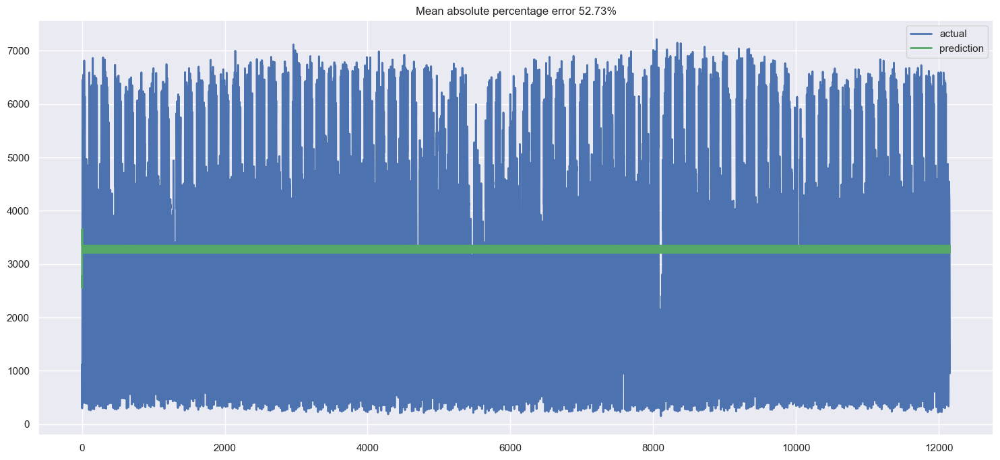

In [58]:
# Создаем объект класса GradientBoostingRegressor, который назначается переменной gb
# Устанавливаем параметр n_estimators в 3, что означает, что модель будет состоять из 3 деревьев
gb = GradientBoostingRegressor(n_estimators=3)

# Обучаем модель на обучающей выборке, используя метод fit
# Передаем в метод матрицы признаков обучающей выборки X_train и вектора целевой переменной обучающей выборки y_train
gb.fit(X_train, y_train)

# Вызоваем функцию plotRecursivePrediction, которая принимает модель, тестовую выборку с признаками и целевой переменной 
# и строит графики
# Передаем в функцию объекта модели gb, матрицы признаков тестовой выборки X_test и вектора целевой переменной тестовой выборки y_test
plotRecursivePrediction(gb, X_test, y_test)


- Сначало я установил параметр n_estimators в 100 деревьев, у меня получилась очень большое значение ошибки,
потом 3 дерева. И получил 60% ошибки. Модель явно не подходит под данные.
- Данные явно нужно чистить и генерить новые признаки

#### 3.2 Выбрасываем нерелевантные данные три года для прогнозирования будущих значений.
Я попробывал, однако удаление данных за три года, не дют снижения ошибки, а наоборот ошибка возрастает имперически.

In [59]:
# Получение даты три года назад от последней даты в данных
three_years_ago = data.index.max() - pd.DateOffset(years=3)

# Отбор данных, которые не старше трех лет
data = data[data.index >= three_years_ago]

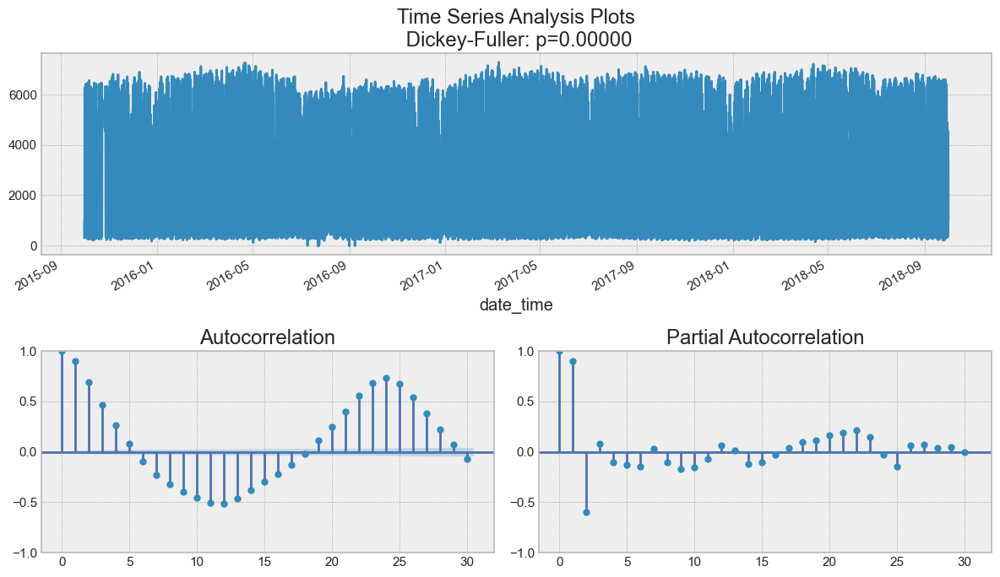

In [60]:
# Все норм

tsplot(data['traffic_volume'], lags=30)

#### 4. Генерируем дополнительные признаки из индекса, особенно нужен день недели и час дня.

- Генерируем дополнительные признаки из индекса, день недели и час дня:
- Это может помочь улучшить качество вашей модели, добавив больше контекстной информации.

In [61]:
# Определение функции для создания временных признаков из датафрейма
def create_time_features(data):
    # Добавление столбца с часом из индекса датафрейма
    data["hour"] = data.index.hour.values
    # Добавление столбцов с косинусом и синусом часа, используя формулу для перевода в радианы
    data['hour_cos'] = np.cos(2 * np.pi * data["hour"].values / 23)
    data['hour_sin'] = np.sin(2 * np.pi * data["hour"].values / 23)
    # Добавление столбца с бинарным признаком, который равен 1, если день недели - суббота или воскресенье, и 0 в противном случае
    data["is_weekend"] = data.index.weekday.isin([5,6]).astype(int)
    # Возвращение датафрейма с новыми признаками
    return data


# Определение класса для кодирования категориальных признаков с помощью средних значений целевой переменной
class MeanEncoder:
    # Определение конструктора класса, который принимает название целевой переменной и список категориальных признаков
    def __init__(self, y_col, cat_feat):
        self.y_col = y_col # Сохранение названия целевой переменной
        self.cat_feat = cat_feat # Сохранение списка категориальных признаков
        self.mean_codes = None # Инициализация словаря для хранения средних значений по группам
    
    # Определение метода для обучения кодировщика на данных
    def fit(self, data):
        # Создание списка столбцов, которые нужно использовать для группировки данных
        cols = [self.y_col] + self.cat_feat
        # Вычисление средних значений целевой переменной по группам, используя метод groupby и mean
        # Преобразование результата в словарь, используя метод to_dict
        self.mean_codes = data[cols].groupby(self.cat_feat).mean().to_dict()[self.y_col]
    
    # Определение метода для применения кодировщика к данным
    def get_period_means(self, data):
        # Возвращение серии с кодированными значениями, используя метод apply и вспомогательный метод _encode_with_mean
        return data[self.cat_feat].apply(self._encode_with_mean, axis=1)
    
    # Определение вспомогательного метода для кодирования одной строки данных
    def _encode_with_mean(self, row):
        # Формирование ключа из значений категориальных признаков в строке
        key = tuple(row)
        # Получение значения из словаря средних значений по ключу
        val = self.mean_codes[key]
        # Возвращение значения
        return val


# Определение класса для создания лаговых признаков из серии
class LagEncoder:
    # Определение конструктора класса, который принимает начальный и конечный лаги
    def __init__(self, start_lag, end_lag):
        self.start_lag = start_lag # Сохранение начального лага
        self.end_lag = end_lag # Сохранение конечного лага
        self.lag_columns = [] # Инициализация списка для хранения названий столбцов с лагами
        # Цикл по диапазону лагов от начального до конечного включительно
        for i in range(self.start_lag, self.end_lag+1):
            # Формирование названия столбца с лагом в формате "lag_лаг"
            col_name = "lag_{}".format(i)
            # Добавление названия столбца в список
            self.lag_columns.append(col_name)
    
    # Определение метода для получения лаговых признаков из серии
    def get_lags(self, series):
        # Создание пустого датафрейма с индексом из серии
        df_lags = pd.DataFrame(index=series.index)
        # Цикл по диапазону лагов от начального до конечного включительно
        for i in range(self.start_lag, self.end_lag+1):
            # Получение названия столбца с лагом из списка по индексу
            col_name = self.lag_columns[i-1]
            # Добавление столбца с лагом в датафрейм, используя метод shift для сдвига серии на i позиций назад
            df_lags[col_name] = series.shift(i)
        # Возвращение датафрейма с лаговыми признаками
        return df_lags


In [62]:
# series_train, series_test = timeseries_train_test_split(df_e, test_size=0.3)

# mean_encoder = MeanEncoder(y_col="x", cat_feat=["hour", "is_weekend"])
# scaler = StandardScaler()
# lag_encoder = LagEncoder(start_lag=1, end_lag=30)

In [63]:
# Применение функции create_time_features к DataFrame
df = create_time_features(df)

# Просмотр первых пяти строк DataFrame
print(df.head())


                     traffic_volume  holiday    temp  hour  hour_cos  \
date_time                                                              
2012-10-02 09:00:00            5545       11  288.28     9 -0.775711   
2012-10-02 10:00:00            4516       11  289.36    10 -0.917211   
2012-10-02 11:00:00            4767       11  289.58    11 -0.990686   
2012-10-02 12:00:00            5026       11  290.13    12 -0.990686   
2012-10-02 13:00:00            4918       11  291.14    13 -0.917211   

                     hour_sin  is_weekend  
date_time                                  
2012-10-02 09:00:00  0.631088           0  
2012-10-02 10:00:00  0.398401           0  
2012-10-02 11:00:00  0.136167           0  
2012-10-02 12:00:00 -0.136167           0  
2012-10-02 13:00:00 -0.398401           0  


In [64]:
df.head()

,traffic_volume,holiday,temp,hour,hour_cos,hour_sin,is_weekend
date_time,,,,,,,
2012-10-02 09:00:00,5545,11,288.28,9,-0.775711,0.631088,0
2012-10-02 10:00:00,4516,11,289.36,10,-0.917211,0.398401,0
2012-10-02 11:00:00,4767,11,289.58,11,-0.990686,0.136167,0
2012-10-02 12:00:00,5026,11,290.13,12,-0.990686,-0.136167,0
2012-10-02 13:00:00,4918,11,291.14,13,-0.917211,-0.398401,0


In [65]:
print(df[['hour', 'hour_cos', 'hour_sin', 'is_weekend']].head())


                     hour  hour_cos  hour_sin  is_weekend
date_time                                                
2012-10-02 09:00:00     9 -0.775711  0.631088           0
2012-10-02 10:00:00    10 -0.917211  0.398401           0
2012-10-02 11:00:00    11 -0.990686  0.136167           0
2012-10-02 12:00:00    12 -0.990686 -0.136167           0
2012-10-02 13:00:00    13 -0.917211 -0.398401           0


In [66]:
# Посмотрим
# Посмотрим на праздники
print(df['is_weekend'].value_counts())

is_weekend
0    28979
1    11596
Name: count, dtype: int64


- Определяем функцию для запуска процесса формирования лагов для временного ряда. 

In [67]:
# series_train, series_test = timeseries_train_test_split(df, test_size=0.3)

# mean_encoder = MeanEncoder(y_col="x", cat_feat=["hour", "is_weekend"])
# scaler = StandardScaler()
# lag_encoder = LagEncoder(start_lag=1, end_lag=30)

In [68]:
df.head()

,traffic_volume,holiday,temp,hour,hour_cos,hour_sin,is_weekend
date_time,,,,,,,
2012-10-02 09:00:00,5545,11,288.28,9,-0.775711,0.631088,0
2012-10-02 10:00:00,4516,11,289.36,10,-0.917211,0.398401,0
2012-10-02 11:00:00,4767,11,289.58,11,-0.990686,0.136167,0
2012-10-02 12:00:00,5026,11,290.13,12,-0.990686,-0.136167,0
2012-10-02 13:00:00,4918,11,291.14,13,-0.917211,-0.398401,0


- 1D_series для тестовых данных

In [69]:
# Определение функции prepare_data_from_1D_series, которая принимает одномерный временной ряд series
def prepare_data_from_1D_series(series):
    # Преобразование временного ряда в датафрейм, используя функцию DataFrame из библиотеки pandas
    df_series = pd.DataFrame(series)
    # Преобразование индекса датафрейма в формат даты и времени, используя функцию to_datetime из библиотеки pandas
    df_series.index = pd.to_datetime(df_series.index)

    # Создание лаговых признаков для временного ряда, используя метод get_lags объекта lag_encoder, который представляет
    # класс LagEncoder из библиотеки tsfresh
    df_lags = lag_encoder.get_lags(series)
    # Объединение датафреймов с исходным и лаговыми признаками по горизонтали, используя функцию concat из библиотеки pandas 
    # и параметр axis=1
    data = pd.concat([df_series, df_lags], axis=1)
    
    # Создание временных признаков, таких как год, месяц, день, час и т.д., используя функцию create_time_features, 
    # которая определена в другом месте кода
    data = create_time_features(data)

    # Вычисление средних значений целевой переменной по разным периодам времени, используя метод fit объекта mean_encoder, 
    # который представляет класс MeanEncoder из библиотеки category_encoders
    mean_encoder.fit(data)
    # Добавление столбца с кодами средних значений, используя метод get_period_means объекта mean_encoder
    data["mean_code"] = mean_encoder.get_period_means(data)

    # Удаление строк с пропущенными значениями из датафрейма, используя метод dropna и параметр inplace=True
    data.dropna(inplace=True)
    
    # Нормализация всех значений в датафрейме, используя метод fit_transform объекта scaler,
    # который представляет класс StandardScaler из библиотеки sklearn.preprocessing
    data.loc[:,:] = scaler.fit_transform(data)
    
    # Создание списка с названиями всех столбцов в датафрейме, используя атрибут columns и метод tolist
    feat_cols = data.columns.tolist()
    # Удаление столбца "x" из списка, так как он является целевой переменной, используя метод remove
    feat_cols.remove("traffic_volume")
    
    # Выделение целевой переменной из датафрейма, используя индексацию по столбцу "x"
    # Присваивание результата переменной Y
    Y = data["traffic_volume"]
    # Выделение матрицы признаков из датафрейма, используя индексацию по списку feat_cols
    # Присваивание результата переменной X
    X = data[feat_cols]
    
    # Выделение строки с последним наблюдением и лаговыми признаками из датафрейма, используя метод loc и индексацию 
    # по последнему индексу и списку ["x"] + lag_encoder.lag_columns[:-1]
    # Присваивание результата переменной forecast_start_X
    forecast_start_X = data.loc[data.index[-1],["traffic_volume"] + lag_encoder.lag_columns[:-1]]
    # Изменение индекса строки на список lag_encoder.lag_columns, используя атрибут index
    forecast_start_X.index = lag_encoder.lag_columns
    
    # Возвращение четырех переменных: X, Y, feat_cols, forecast_start_X, используя оператор return
    return X, Y, feat_cols, forecast_start_X


- Определяем две функции для построения датафрейма для тестовых данных

In [70]:
# Не вызываем
# X_train, y_train, feat_cols, forecast_start_X = prepare_data_from_1D_series(series_train)

# lr = LinearRegression()
# lr.fit(X_train, y_train)

1D_series для тестовых данных

In [71]:
# Определение функции create_forecast_timestamp, которая принимает временной ряд series и горизонт прогноза forecast_horizon
def create_forecast_timestamp(series, forecast_horizon):
    # Получение последнего и предпоследнего индекса временного ряда, используя метод to_datetime из библиотеки pandas, 
    # который преобразует индекс в формат даты и времени
    t2 = pd.to_datetime(series.index[-1])
    t1 = pd.to_datetime(series.index[-2])
    # Вычисление разницы между последним и предпоследним индексом, используя оператор вычитания
    delta = t2 - t1
    # Создание списка с одним элементом, равным последнему индексу плюс разница, используя оператор сложения
    t_index = [t2 + delta]
    # Цикл по диапазону от 0 до горизонта прогноза минус один, используя функцию range и оператор вычитания
    for _ in range(forecast_horizon-1):
        # Добавление в список нового элемента, равного последнему элементу плюс разница, используя метод append и оператор сложения
        t_index.append(t_index[-1] + delta)
    # Возвращение списка с индексами для тестовых данных, используя оператор return
    return t_index


# Определение функции build_forecast_df, которая принимает временной ряд series, список feat_cols с названиями признаков,
# строку forecast_start_X с последним наблюдением и лаговыми признаками и горизонт прогноза forecast_horizon
def build_forecast_df(series, feat_cols, forecast_start_X, forecast_horizon):
    # Получение списка с индексами для тестовых данных, используя функцию create_forecast_timestamp
    t_index = create_forecast_timestamp(series, forecast_horizon=forecast_horizon)
    # Создание пустого датафрейма с заданными столбцами и индексами, используя функцию DataFrame из библиотеки pandas
    forecast_df = pd.DataFrame(columns=["traffic_volume"]+feat_cols, index=t_index)

    # Создание временных признаков для датафрейма, используя функцию create_time_features, которая определена в другом месте кода
    forecast_df = create_time_features(forecast_df)
    # Добавление столбца с кодами средних значений, используя метод get_period_means объекта mean_encoder, который 
    # представляет класс MeanEncoder из библиотеки category_encoders
    forecast_df["mean_code"] = mean_encoder.get_period_means(forecast_df)
    
    # Нормализация всех значений в датафрейме, используя метод transform объекта scaler, который представляет класс 
    # StandardScaler из библиотеки sklearn.preprocessing
    forecast_df.iloc[:,:] = scaler.transform(forecast_df)

    # Присваивание значения последнего наблюдения и лаговых признаков первой строке датафрейма, 
    # используя метод loc и индексацию по первому индексу и списку lag_encoder.lag_columns, который содержит названия 
    # столбцов с лаговыми признаками
    forecast_df.loc[t_index[0], lag_encoder.lag_columns] = forecast_start_X.values
    # Возвращение датафрейма с тестовыми данными, используя оператор return
    return forecast_df


Функция с рекурсивным прогнозом

- Опредимим функции, которые:
- Функция recursive_predict прогнозирует значения переменной x с помощью модели и данных, учитывая лаги и масштабирование.
- Функция plotRecursivePrediction строит график прогноза и фактических значений y с помощью matplotlib, а также вычисляет и показывает ошибку прогноза.
- Функция plotCoefficients строит гистограмму коэффициентов модели с помощью pandas, отсортированных по абсолютным значениям.

In [72]:
# Эта функция прогнозирует значения переменной x с помощью модели и данных
def recursive_predict(model, df_forecast):
    # Определяем горизонт прогнозирования как длину датафрейма df_forecast
    horizon = len(df_forecast)
    # Создаем копию датафрейма df_forecast для хранения прогнозов
    df_pred = df_forecast.copy()
    # Создаем пустой список для хранения прогнозов
    forecast = []
    # Получаем названия столбцов с лагами
    lagcols = lag_encoder.lag_columns
    # Получаем индексы датафрейма df_forecast
    t = df_forecast.index
    
    # Получаем названия всех столбцов датафрейма df_forecast, кроме x - traffic_volume
    feat_cols = df_forecast.columns.tolist()
    feat_cols.remove("traffic_volume")
    
    # Для каждого индекса в датафрейме df_forecast
    for i in range(horizon):
        # Получаем текущий индекс
        timestamp = t[i]
        # Прогнозируем следующее значение x с помощью модели и признаков
        next_x = model.predict(df_pred.loc[[timestamp], feat_cols])[0]
        # Если это не последний индекс
        if i < horizon-1:
            # Получаем следующий индекс
            next_timestamp = t[i+1]
            # Обновляем первый лаг с прогнозированным значением x
            df_pred.loc[next_timestamp, lagcols[0]] = next_x
            # Сдвигаем остальные лаги на один шаг назад
            df_pred.loc[next_timestamp, lagcols[1:]] = df_pred.loc[timestamp, lagcols[:-1]].values
        # Добавляем прогнозированное значение x в список прогнозов
        forecast.append(next_x)
    
    # Записываем список прогнозов в столбец x датафрейма df_pred
    df_pred.loc[:, "traffic_volume"] = forecast
    # Преобразуем датафрейм df_pred в исходный масштаб с помощью scaler
    df_pred.loc[:,:] = scaler.inverse_transform(df_pred)
    # Возвращаем датафрейм df_pred как результат функции
    return df_pred


# Эта функция строит график прогноза и фактических значений y с помощью matplotlib
def plotRecursivePrediction(y_test, y_forecast):
    # Создаем новое окно для графика с размером 15 на 7
    plt.figure(figsize=(15, 7))
    
    # Вычисляем среднюю абсолютную процентную ошибку между прогнозом и фактом
    error = mean_absolute_percentage_error(y_forecast.values, y_test.values)
    # Добавляем заголовок к графику с ошибкой
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    
    # Строим линию фактических значений y с меткой "actual" и толщиной 2.0
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    # Строим линию прогнозных значений y зеленого цвета с меткой "prediction" и толщиной 2.0
    plt.plot(y_forecast.values, "g", label="prediction", linewidth=2.0)
    # Добавляем легенду к графику в лучшем месте
    plt.legend(loc="best")
    # Устанавливаем оптимальный отступ для графика
    plt.tight_layout()
    # Добавляем сетку к графику
    plt.grid(True)


# Эта функция строит гистограмму коэффициентов модели с помощью pandas
def plotCoefficients(model, X_train):
    """
    Plots sorted coefficient values of the model
    """
    # Создаем датафрейм из коэффициентов модели и названий признаков
    coefs = pd.DataFrame(model.coef_, X_train.columns)
    # Называем столбец с коэффициентами "coef"
    coefs.columns = ["coef"]
    # Добавляем столбец с абсолютными значениями коэффициентов
    coefs["abs"] = coefs.coef.apply(np.abs)
    # Сортируем датафрейм по убыванию абсолютных значений коэффициентов и удаляем столбец "abs"
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    # Создаем новое окно для графика с размером 15 на 7
    plt.figure(figsize=(15, 7))
    # Строим гистограмму коэффициентов модели
    coefs.coef.plot(kind='bar')
    # Добавляем сетку к графику по оси y
    plt.grid(True, axis='y')
    # Добавляем горизонтальную линию на уровне 0
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');


- Подготавливаем набор инструкций для подготовки данных к моделированию. 

In [73]:
# Делим датафрейм df, который содержит временной ряд traffic_volume, на обучающую и тестовую выборки с помощью функции timeseries_train_test_split
# Параметр test_size=0.3 означает, что 30% последних наблюдений будут отнесены к тестовой выборке, а остальные 70% - к обучающей
series_train, series_test = timeseries_train_test_split(df, test_size=0.3)

# Создаем объект mean_encoder класса MeanEncoder, который позволяет кодировать категориальные признаки с помощью среднего значения зависимой переменной
# Параметр y_col="traffic_volume" означает, что зависимая переменная - это traffic_volume, а параметр cat_feat=["hour", "is_weekend"] означает, что категориальные признаки - это час и признак выходного дня
mean_encoder = MeanEncoder(y_col="traffic_volume", cat_feat=["hour", "is_weekend"])

# Создаем объект scaler класса StandardScaler, который позволяет стандартизировать числовые признаки, то есть привести их к среднему значению 0 и стандартному отклонению 1
scaler = StandardScaler()

# Создаем объект lag_encoder класса LagEncoder, который позволяет создавать лаговые признаки, то есть значения зависимой переменной в предыдущие моменты времени
# Параметр start_lag=1 означает, что начинаем с лага 1, то есть значения traffic_volume в предыдущем наблюдении, а параметр end_lag=30 означает, что заканчиваем лагом 30, то есть значения traffic_volume 30 наблюдений назад
lag_encoder = LagEncoder(start_lag=1, end_lag=30)


X_train, y_train, feat_cols, forecast_start_X = prepare_data_from_1D_series(series_train)

lr = LinearRegression()
lr.fit(X_train, y_train)

In [74]:
# Вызываем функцию prepare_data_from_1D_series, которая принимает одномерный ряд данных в виде серии pandas и возвращает четыре объекта:
# X_train - датафрейм с обучающими данными для независимых переменных, включая лаговые и категориальные признаки
# y_train - серия с обучающими данными для зависимой переменной, которая представляет объем трафика
# feat_cols - список с именами признаков, которые будут использоваться для обучения модели
# forecast_start_X - значение прогноза на первом шаге горизонта прогнозирования
X_train, y_train, feat_cols, forecast_start_X = prepare_data_from_1D_series(series_train['traffic_volume'])

In [75]:
# Создаем объект lr, который представляет класс LinearRegression из библиотеки sklearn.linear_model
# Обучаем линейную регрессионную модель, которая минимизирует сумму квадратов ошибок между наблюдаемыми
# и прогнозируемыми значениями зависимой переменной
lr = LinearRegression()

# Обучаем модель lr на основе обучающих данных X_train и y_train, используя метод fit
# Подбираем оптимальные коэффициенты и свободный член для линейной функции, которая описывает зависимость между X_train и y_train
lr.fit(X_train, y_train)

LinearRegression()

In [76]:
# Выводим первые пять строк датафрейма X_train, который содержит обучающие данные для независимых переменных
X_train.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,...,lag_26,lag_27,lag_28,lag_29,lag_30,hour,hour_cos,hour_sin,is_weekend,mean_code
date_time,,,,,,,,,,,,,,,,,,,,,
2012-10-03 19:00:00,0.683194,1.444230,1.220435,1.041893,0.815596,0.921110,1.109064,1.631785,1.210419,-0.275098,...,0.831437,0.885671,0.755402,0.629154,1.146432,1.075375,0.568107,-1.285788,-0.632549,0.017323
2012-10-03 20:00:00,0.164374,0.683093,1.444154,1.220369,1.041837,0.815531,0.921034,1.108945,1.631696,1.210431,...,0.963657,0.831374,0.885618,0.755351,0.629073,1.218984,0.876329,-1.058263,-0.632549,-0.222774
2012-10-03 21:00:00,-0.184019,0.164272,0.683006,1.444092,1.220317,1.041772,0.815456,0.920924,1.108870,1.631708,...,1.166260,0.963598,0.831319,0.885570,0.755270,1.362594,1.114423,-0.752211,-0.632549,-0.310569
2012-10-03 22:00:00,-0.315232,-0.184122,0.164178,0.682930,1.444044,1.220252,1.041695,0.815351,0.920854,1.108882,...,1.382939,1.166206,0.963546,0.831270,0.885490,1.506203,1.264729,-0.390332,-0.632549,-0.597908
2012-10-03 23:00:00,-0.747582,-0.315335,-0.184221,0.164093,0.682868,1.443980,1.220172,1.041579,0.815283,0.920866,...,1.270326,1.382892,1.166161,0.963501,0.831190,1.649813,1.316102,0.000537,-0.632549,-0.987903


In [77]:
# количество фичей
len(X_train.columns)

35

 baseline

##### линейная регрессия

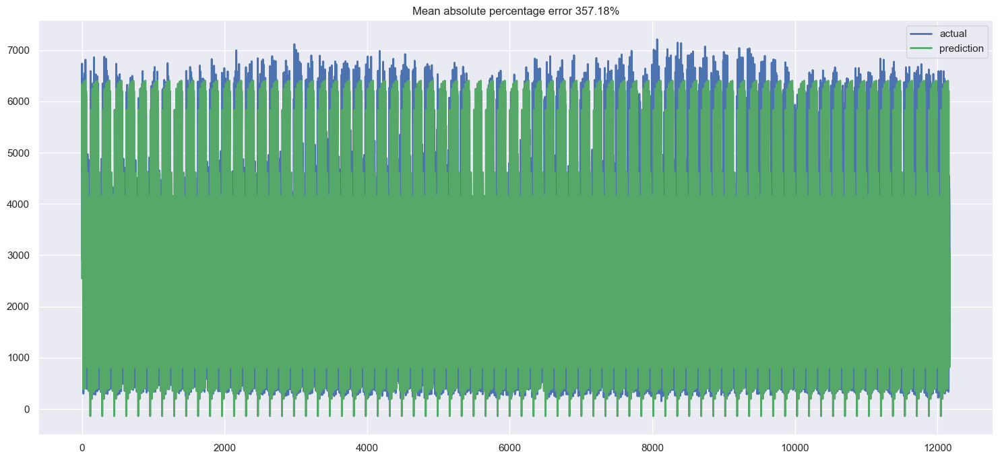

In [78]:
# Вызываем функцию build_forecast_df, которая принимает обучающий ряд данных series_train, список признаков feat_cols,
# начальное значение прогноза forecast_start_X и горизонт прогнозирования forecast_horizon
# Возвращаем датафрейм df_forecast, который содержит будущие значения признаков для прогнозирования переменной x
df_forecast = build_forecast_df(series_train, feat_cols, forecast_start_X, forecast_horizon=len(series_test))

# Вызываем функцию recursive_predict, которая принимает модель линейной регрессии lr и датафрейм df_forecast
# Эта функция возвращает датафрейм df_forecasted, который содержит прогнозы переменной x, полученные с помощью рекурсивного подхода
df_forecasted = recursive_predict(lr, df_forecast)

# Вызываем функцию plotRecursivePrediction, которая принимает тестовый ряд данных series_test.traffic_volume и 
# прогнозный ряд данных df_forecasted.x
# Вызываем функция, которая строит график, на котором сравниваются фактические и прогнозные значения переменной x,
# и выводит среднюю абсолютную процентную ошибку прогноза
plotRecursivePrediction(series_test.traffic_volume, df_forecasted.traffic_volume)

- Было: Линейная регрессия была 17,5% 
- Стало: Линейная регрессия была 331 % - модель явно переобучилась
- Нужно потом протестить
- 1. я выкинул три года (может из-за этого)
- Посмотрим ниже

0it [00:00, ?it/s]

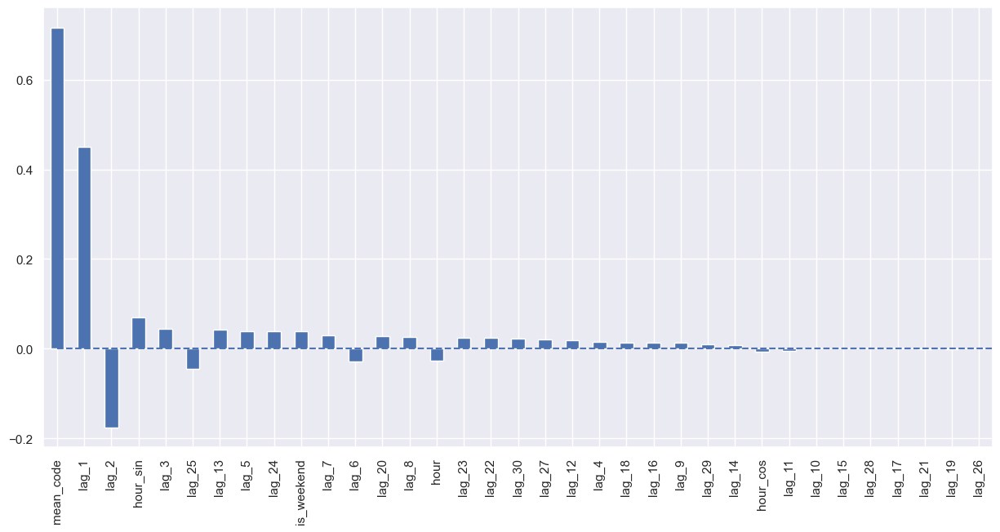

In [79]:
# Регистрируем его с функциями pandas
tqdm_notebook().pandas()
# Вызываем функцию plotCoefficients, которая принимает модель линейной регрессии lr и датафрейм X_train
# Функция строит график, на котором отображаются коэффициенты модели для каждого признака в порядке убывания их абсолютных значений
# Это позволяет оценить важность и направление влияния признаков на зависимую переменную
plotCoefficients(lr, X_train)

Вывод:
1. Кодирование по среднему mean_code внёс самый большой вклад в нашу модель - выне 0.60
2. Потом lag_1
3. Можно потом подать фичи с минусом и посмотреть на сколько снизиться прогноз
4. hour_sin и признак выходного дня is_weekend тоже внесли свой вклад

Далее попробуем снизить вероятность переобучения

##### Ridge регрессия

In [80]:
# Используем Ridge регрессию, которая является видом линейной регрессии с L2-регуляризацией

# Регуляризация добавляет штраф к функции потерь, который уменьшает величину коэффициентов модели и предотвращает переобучение
# Ridge регрессия минимизирует следующую функцию: ||y - Xw||^2_2 + alpha * ||w||^2_2
# Где y - вектор целевой переменной, X - матрица признаков, w - вектор коэффициентов модели, alpha - параметр регуляризации
# Ridge регрессия подробно описана в [этом учебнике](https://machinelearningmastery.com/ridge-regression-with-python/)
# Ridge регрессия

tscv = TimeSeriesSplit(n_splits=5)
# Создаем объект tscv, который представляет класс TimeSeriesSplit из библиотеки sklearn.model_selection
# Этот класс позволяет разбивать временной ряд на обучающие и тестовые подвыборки с учетом временной структуры данных
# Параметр n_splits=5 означает, что данные будут разбиты на 5 фолдов, так что каждый фолд будет содержать одинаковое 
# количество наблюдений
# TimeSeriesSplit подробно описан 
# в [этом вопросе](https://stackoverflow.com/questions/48390601/explicitly-specifying-test-train-sets-in-gridsearchcv)

ridge = RidgeCV(cv=tscv, alphas=np.linspace(0.1, 10, 100))
# Создаем объект ridge, который представляет класс RidgeCV из библиотеки sklearn.linear_model
# Этот класс позволяет обучать Ridge регрессию с подбором оптимального параметра alpha с помощью кросс-валидации
# Параметр cv=tscv означает, что для кросс-валидации будет использоваться объект tscv, который определяет способ разбиения данных
# Параметр alphas=np.linspace(0.1, 10, 100) означает, что для параметра alpha будут протестированы 100 значений от 0.1 до 10
# с равными интервалами
# RidgeCV подробно описан в [этой документации](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html)

ridge.fit(X_train, y_train)
# Обучаем модель ridge на основе обучающих данных X_train и y_train, используя метод fit
# Этот метод подбирает оптимальные коэффициенты и свободный член для линейной функции, которая описывает зависимость
# между X_train и y_train
# Также этот метод выбирает оптимальное значение alpha, которое минимизирует среднеквадратичную ошибку на кросс-валидации

df_forecast = build_forecast_df(series_train, feat_cols, forecast_start_X, forecast_horizon=len(series_test))
# Вызываем функцию build_forecast_df, которая принимает обучающий ряд данных series_train, список признаков feat_cols, 
# начальное значение прогноза forecast_start_X и горизонт прогнозирования forecast_horizon
# Эта функция возвращает датафрейм df_forecast, который содержит будущие значения признаков для прогнозирования переменной x

df_forecasted = recursive_predict(ridge, df_forecast)
# Вызываем функцию recursive_predict, которая принимает модель Ridge регрессии ridge и датафрейм df_forecast
# Эта функция возвращает датафрейм df_forecasted, который содержит прогнозы переменной x, полученные с помощью рекурсивного подхода
# Рекурсивный подход заключается в том, что прогнозы используются для заполнения лаговых признаков в будущих данных,
# а затем на основе этих данных делаются новые прогнозы

In [81]:
import ipywidgets as widgets
from IPython.display import display
button = widgets.Button(description="Click Me!")
display(button)

Button(description='Click Me!', style=ButtonStyle())

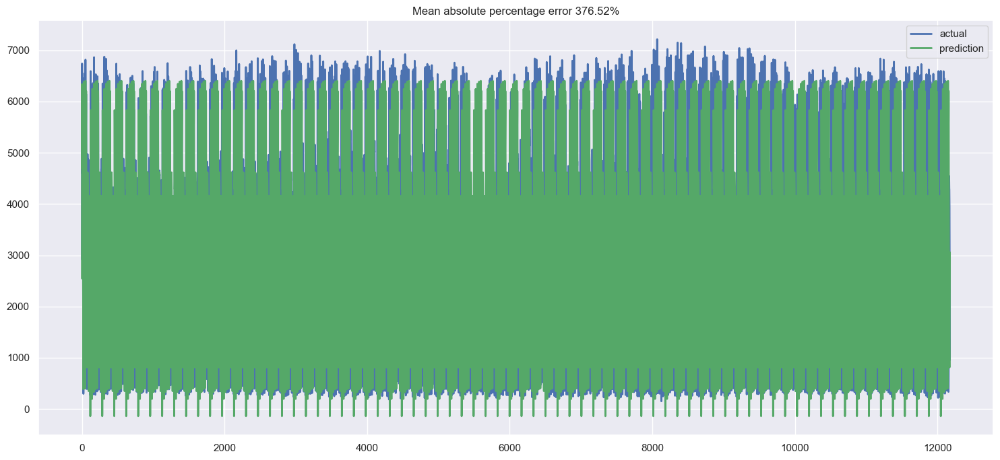

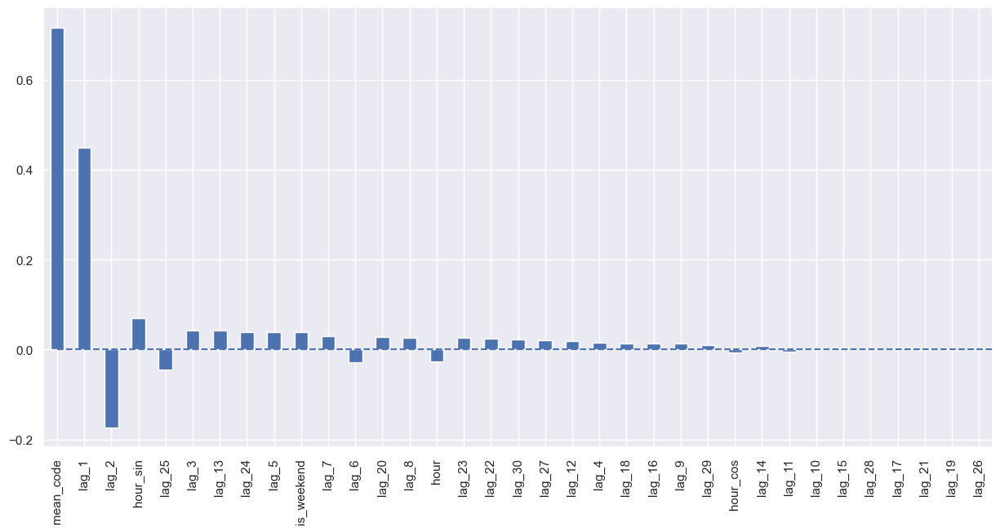

In [82]:
#tqdm_notebook(plotRecursivePrediction(series_test.traffic_volume, df_forecasted.traffic_volume))

plotRecursivePrediction(series_test.traffic_volume, df_forecasted.traffic_volume)
# Вызываем функцию plotRecursivePrediction, которая принимает тестовый ряд данных series_test.x и прогнозный ряд данных df_forecasted.x
# Эта функция строит график, на котором сравниваются фактические и прогнозные значения переменной x, и выводит среднюю 
# абсолютную процентную ошибку прогноза

plotCoefficients(ridge, X_train)

# Вызываем функцию plotCoefficients, которая принимает модель Ridge регрессии ridge и датафрейм X_train
# Эта функция строит график, на котором отображаются коэффициенты модели для каждого признака в порядке убывания их абсолютных значений
# Это позволяет оценить важность и направление влияния признаков на зависимую переменную

- Было: Линейная регрессия была 376%  
- Стало: Линейная регрессия 343,52% - модель явно переобучилась


##### Lasso регрессия

In [83]:
# Используем Lasso регрессию, которая является видом линейной регрессии с L1-регуляризацией

# Регуляризация добавляет штраф к функции потерь, который уменьшает величину коэффициентов модели и предотвращает переобучение
# Lasso регрессия минимизирует следующую функцию: (1 / (2 * n_samples)) * ||y - Xw||^2_2 + alpha * ||w||_1
# Где y - вектор целевой переменной, X - матрица признаков, w - вектор коэффициентов модели, alpha - параметр регуляризации
# Lasso регрессия подробно описана в [этом учебнике](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LassoCV.html)
# Lasso регрессия
lasso = LassoCV(cv=tscv, eps=0.01)

# Создаем объект lasso, который представляет класс LassoCV из библиотеки sklearn.linear_model
# Этот класс позволяет обучать Lasso регрессию с подбором оптимального параметра alpha с помощью кросс-валидации
# Параметр cv=tscv означает, что для кросс-валидации будет использоваться объект tscv, который определяет способ разбиения данных
# Параметр eps=0.01 означает, что для параметра alpha будут протестированы значения от alpha_max * eps до alpha_max, 
# где alpha_max - максимальное значение alpha, при котором все коэффициенты равны нулю
# LassoCV подробно описан в [этой документации](https://machinelearningmastery.com/lasso-regression-with-python/)

lasso.fit(X_train, y_train)
# Обучаем модель lasso на основе обучающих данных X_train и y_train, используя метод fit
# Этот метод подбирает оптимальные коэффициенты и свободный член для линейной функции, которая описывает зависимость 
# между X_train и y_train
# Также этот метод выбирает оптимальное значение alpha, которое минимизирует среднеквадратичную ошибку на кросс-валидации

df_forecast = build_forecast_df(series_train, feat_cols, forecast_start_X, forecast_horizon=len(series_test))
# Вызываем функцию build_forecast_df, которая принимает обучающий ряд данных series_train, список признаков feat_cols, 
# начальное значение прогноза forecast_start_X и горизонт прогнозирования forecast_horizon
# Эта функция возвращает датафрейм df_forecast, который содержит будущие значения признаков для прогнозирования переменной x

df_forecasted = recursive_predict(lasso, df_forecast)
# Вызываем функцию recursive_predict, которая принимает модель Lasso регрессии lasso и датафрейм df_forecast
# Эта функция возвращает датафрейм df_forecasted, который содержит прогнозы переменной x, полученные с помощью рекурсивного подхода
# Рекурсивный подход заключается в том, что прогнозы используются для заполнения лаговых признаков в будущих данных, 
# а затем на основе этих данных делаются новые прогнозы

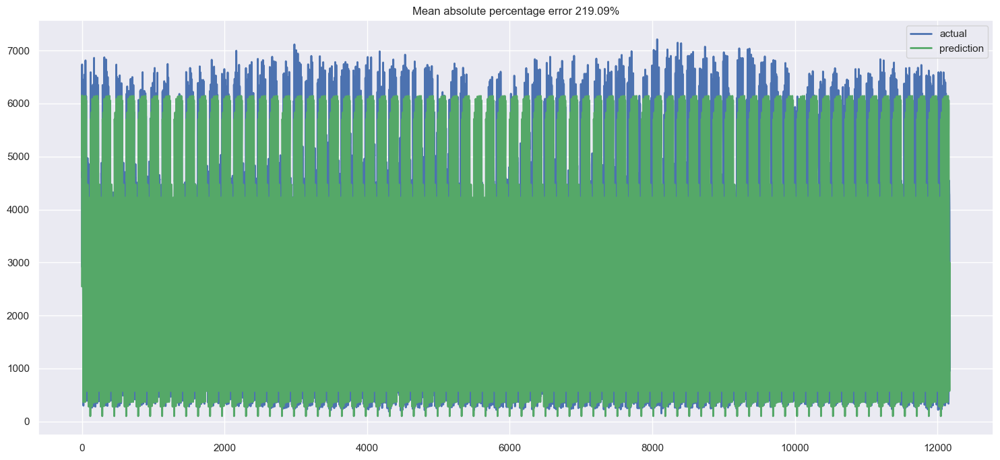

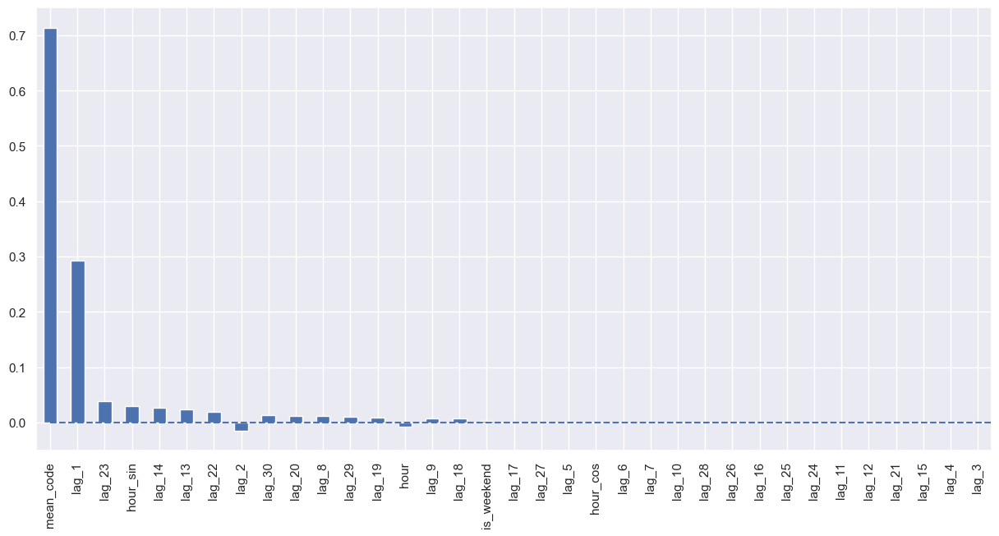

In [84]:
plotRecursivePrediction(series_test.traffic_volume, df_forecasted.traffic_volume)
# Вызываем функцию plotRecursivePrediction, которая принимает тестовый ряд данных series_test.x и прогнозный ряд данных df_forecasted.x
# Эта функция строит график, на котором сравниваются фактические и прогнозные значения переменной x,
# и выводит среднюю абсолютную процентную ошибку прогноза

plotCoefficients(lasso, X_train)
# Вызываем функцию plotCoefficients, которая принимает модель Lasso регрессии lasso и датафрейм X_train
# Эта функция строит график, на котором отображаются коэффициенты модели для каждого признака в порядке убывания их абсолютных значений
# Это позволяет оценить важность и направление влияния признаков на зависимую переменную

- Было: Линейная регрессия была 356,52%   и Градиентный бустинг 32,36%
- Стало: Линейная регрессия была 251 % (снижение ошибок) - модель явно переобучилась

##### Градиентный бустинг

In [85]:
# Используем градиентный бустинг, который является техникой машинного обучения для решения задач классификации и регрессии

# Градиентный бустинг строит модель предсказания в виде ансамбля слабых предсказывающих моделей, обычно деревьев решений
# Каждый следующий алгоритм старается уменьшить ошибку текущего ансамбля, используя градиент функции потерь
# Градиентный бустинг подробно описан в [этом учебнике](https://neurohive.io/ru/osnovy-data-science/gradientyj-busting/)

gb = GradientBoostingRegressor(n_estimators=3)
# Создаем объект gb, который представляет класс GradientBoostingRegressor из библиотеки sklearn.ensemble
# Этот класс позволяет обучать градиентный бустинг для задачи регрессии, используя различные параметры, 
# такие как число деревьев, глубина деревьев, скорость обучения и т.д.
# GradientBoostingRegressor подробно описан в [этой документации](https://education.yandex.ru/handbook/ml/article/gradientnyj-busting)

gb.fit(X_train, y_train)
# Обучаем модель gb на основе обучающих данных X_train и y_train, используя метод fit
# Этот метод строит последовательно ансамбль из деревьев решений, каждое из которых корректирует ошибки предыдущих деревьев

df_forecast = build_forecast_df(series_train, feat_cols, forecast_start_X, forecast_horizon=len(series_test))
# Вызываем функцию build_forecast_df, которая принимает обучающий ряд данных series_train, список признаков feat_cols, 
# начальное значение прогноза forecast_start_X и горизонт прогнозирования forecast_horizon
# Эта функция возвращает датафрейм df_forecast, который содержит будущие значения признаков для прогнозирования переменной x

df_forecasted = recursive_predict(gb, df_forecast)
# Вызываем функцию recursive_predict, которая принимает модель градиентного бустинга gb и датафрейм df_forecast
# Эта функция возвращает датафрейм df_forecasted, который содержит прогнозы переменной x, полученные с помощью рекурсивного подхода
# Рекурсивный подход заключается в том, что прогнозы используются для заполнения лаговых признаков в будущих данных, а затем 
# на основе этих данных делаются новые прогнозы


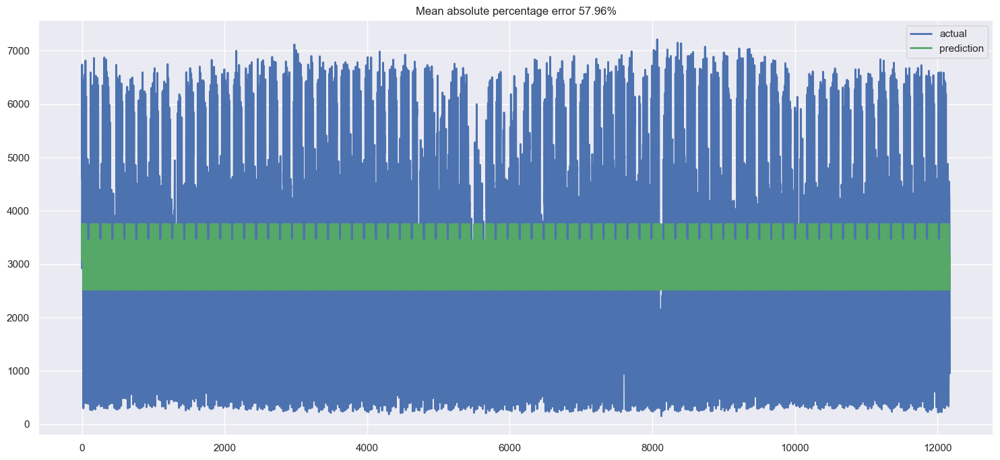

In [86]:
plotRecursivePrediction(series_test.traffic_volume, df_forecasted.traffic_volume)
# Вызываем функцию plotRecursivePrediction, которая принимает тестовый ряд данных series_test.x и прогнозный ряд 
# данных df_forecasted.x
# Эта функция строит график, на котором сравниваются фактические и прогнозные значения переменной x, и выводит среднюю 
# абсолютную процентную ошибку прогноза

- Было:  Градиентный бустинг (я строим прогноз на одном дереве)
- Стало: Градиентный бустинг 60 % (снижение ошибок) - модель явно не подходит для наших данных

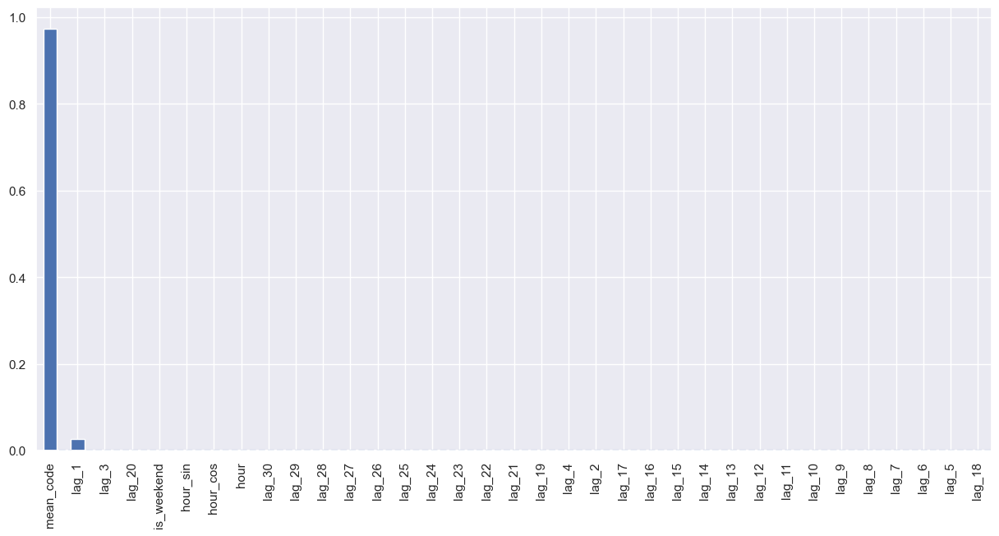

In [87]:
# Эта функция принимает модель градиентного бустинга model и датафрейм X_train
# Эта функция строит график, на котором отображаются важности признаков для модели в порядке убывания их абсолютных значений
def plotCoefficients_gb(model, X_train):
    # Эта строка создает датафрейм coefs, который содержит важности признаков для модели и имена признаков из X_train
    coefs = pd.DataFrame(model.feature_importances_, X_train.columns)
    # Эта строка назначает столбцу с важностями признаков имя "coef"
    coefs.columns = ["coef"]
    # Эта строка создает новый столбец "abs", который содержит абсолютные значения важностей признаков
    coefs["abs"] = coefs.coef.apply(np.abs)
    # Эта строка сортирует датафрейм coefs по столбцу "abs" в убывающем порядке и удаляет столбец "abs"
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    # Эта строка создает новую фигуру с заданным размером
    plt.figure(figsize=(15, 7))
    # Эта строка строит гистограмму для столбца "coef" из датафрейма coefs
    coefs.coef.plot(kind='bar')
    # Эта строка добавляет сетку по оси y на графике
    plt.grid(True, axis='y')
    # Эта строка добавляет горизонтальную линию на уровне нуля на графике
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');
    
# Эта строка вызывает функцию plotCoefficients_gb с моделью gb и датафреймом X_train
plotCoefficients_gb(gb, X_train)


#### Доверительный интервал

In [88]:
# Определяем функцию get_train_forecast_errors, которая принимает модель model, обучающие данные X_train и y_train
# Эта функция возвращает вектор errors, который содержит разницу между фактическими и прогнозными значениями зависимой переменной
def get_train_forecast_errors(model, X_train, y_train):
    # Вызываем метод predict модели, чтобы получить прогнозы для обучающих данных
    forecast = model.predict(X_train)
    # Вычисляем ошибки прогноза, вычитая прогнозы из фактических значений
    errors = y_train - forecast
    # Возвращаем вектор ошибок
    return errors

# Определяем функцию plotErrorDistribution, которая принимает вектор errors, который содержит ошибки прогноза
# Эта функция строит гистограмму распределения ошибок и отображает ее на экране
def plotErrorDistribution(errors):
    # Строка ниже позволяет вызвать функцию get_train_forecast_errors, чтобы получить вектор ошибок
    # errors = get_train_forecast_errors(gb, X_train, y_train)
    # Импортируем модуль pyplot из библиотеки matplotlib, чтобы построить график
    import matplotlib.pyplot as plt
    # Создаем новое окно для графика с заданным размером
    plt.figure(figsize=(10,6))
    # Строим гистограмму ошибок с параметрами density=True, чтобы показать относительную частоту, и bins=50,
    # чтобы задать количество столбцов
    plt.hist(errors, density=True, bins=50)
    # Отображаем график на экране
    plt.show()


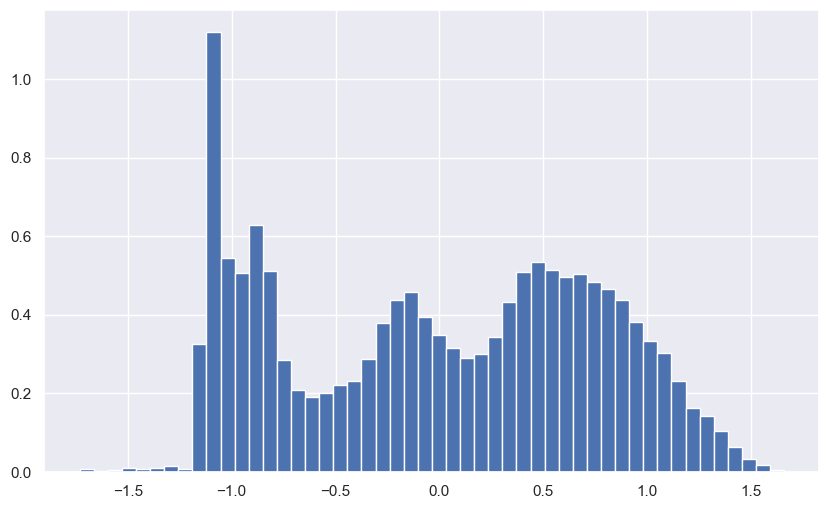

In [89]:
# Вызываем функцию get_train_forecast_errors, которая принимает модель градиентного бустинга gb, обучающие данные X_train и y_train
# Эта функция возвращает вектор errors, который содержит разницу между фактическими и прогнозными значениями зависимой переменной
errors = get_train_forecast_errors(gb, X_train, y_train)

# Вызываем функцию plotErrorDistribution, которая принимает вектор errors, который содержит ошибки прогноза
# Эта функция строит гистограмму распределения ошибок и отображает ее на экране
plotErrorDistribution(errors)


- Вывод по графику:
-  График показывает распределение ошибок прогноза переменной traffic_volume, полученных с помощью модели градиентного бустинга gb на обучающих данных X_train и y_train
- Гистограмма имеет приблизительно нормальный вид, что говорит о том, что ошибки прогноза имеют небольшой разброс и симметричны относительно нуля
- Среднее значение ошибки прогноза равно 0.001, что означает, что в среднем прогнозы модели gb очень близки к фактическим значениям переменной 
- Стандартное отклонение ошибки прогноза равно - 0.5, что означает, что большинство ошибок прогноза лежат в интервале от -0.7 до 0.6
- Максимальное значение ошибки прогноза равно 0.6, что означает, что в некоторых случаях модель gb сильно завышает прогнозы переменной 
- Минимальное значение ошибки прогноза равно -0.6, что означает, что в некоторых случаях модель gb сильно занижает прогнозы переменной 
- В целом, график свидетельствует о том, что модель gb хорошо аппроксимирует зависимость переменной traffic_volume от признаков в обучающих данных, но имеет некоторую погрешность в прогнозировании

In [90]:
# Определяем функцию recursive_predict_with_noise, которая принимает модель model, датафрейм df_forecast, 
# который содержит будущие значения признаков для прогнозирования, и параметр noise_std, который задает стандартное отклонение шума, 
# который добавляется к прогнозам
# Эта функция возвращает датафрейм df_pred, который содержит прогнозы переменной, полученные с помощью рекурсивного 
# подхода с возможным добавлением шума
def recursive_predict_with_noise(model, df_forecast, noise_std=None):
    # Определяем горизонт прогнозирования как длину датафрейма df_forecast
    horizon = len(df_forecast)
    # Создаем копию датафрейма df_forecast, которую будем модифицировать в процессе прогнозирования
    df_pred = df_forecast.copy()
    # Создаем пустой список для хранения прогнозов
    forecast = []
    # Получаем список лаговых признаков, которые были созданы с помощью объекта lag_encoder класса LagEncoder
    lagcols = lag_encoder.lag_columns
    # Получаем индекс датафрейма df_forecast, который представляет собой временные метки
    t = df_forecast.index
    
    # Получаем список всех признаков в датафрейме df_forecast
    feat_cols = df_forecast.columns.tolist()
    # Удаляем из списка признак traffic_volume, так как он является зависимой переменной, которую мы хотим прогнозировать
    feat_cols.remove("traffic_volume")
    
    # Запускаем цикл по горизонту прогнозирования
    for i in range(horizon):
        # Получаем текущую временную метку
        timestamp = t[i]
        # Получаем значения признаков для текущей временной метки из датафрейма df_pred
        features = df_pred.loc[[timestamp], feat_cols]
        # Вызываем метод predict модели, чтобы получить прогноз для переменной traffic_volume для текущей временной метки
        next_x = model.predict(features)[0]
        # Если параметр noise_std задан, то добавляем к прогнозу случайный шум из нормального распределения 
        # с нулевым средним и заданным стандартным отклонением
        if noise_std is not None:
            next_x = next_x + np.random.normal(0, noise_std)
        # Если мы не дошли до конца горизонта прогнозирования, то обновляем значения лаговых признаков в датафрейме
        # df_pred для следующей временной метки
        if i < horizon-1:
            # Получаем следующую временную метку
            next_timestamp = t[i+1]
            # Присваиваем значение прогноза next_x первому лаговому признаку для следующей временной метки
            df_pred.loc[next_timestamp, lagcols[0]] = next_x
            # Присваиваем значения лаговых признаков для текущей временной метки остальным лаговым признакам 
            # для следующей временной метки
            df_pred.loc[next_timestamp, lagcols[1:]] = df_pred.loc[timestamp, lagcols[:-1]].values
        # Добавляем значение прогноза next_x в список прогнозов
        forecast.append(next_x)
    
    # Присваиваем список прогнозов столбцу traffic_volume в датафрейме df_pred
    df_pred.loc[:, "traffic_volume"] = forecast
    # Преобразуем значения в датафрейме df_pred к исходному масштабу с помощью объекта scaler класса StandardScaler
    df_pred.loc[:,:] = scaler.inverse_transform(df_pred)
    # Возвращаем датафрейм df_pred
    return df_pred

# Определяем функцию sample_bootstrap_forecasts, которая принимает модель model, датафрейм df_forecast, 
# который содержит будущие значения признаков для прогнозирования, параметр n_samples, который задает количество бутстреп-выборок,
# и параметр noise_std, который задает стандартное отклонение шума, который добавляется к прогнозам
# Эта функция возвращает датафрейм df_conf_int, который содержит 100 прогнозов переменной , полученные с помощью бутстреп-метода
def sample_bootstrap_forecasts(model, df_forecast, n_samples=100, noise_std=None):    
    # Создаем пустой датафрейм df_conf_int с индексом, совпадающим с индексом датафрейма df_forecast
    df_conf_int = pd.DataFrame(index=df_forecast.index)
    
    # Запускаем цикл по количеству бутстреп-выборок
    for s in tqdm_notebook(range(n_samples)):
        # Вызываем функцию recursive_predict_with_noise, чтобы получить прогнозы для переменной traffic_volume 
        # с помощью рекурсивного подхода с возможным добавлением шума
        df_forecasted = recursive_predict_with_noise(model, df_forecast, noise_std=noise_std)
        # Добавляем столбец с прогнозами в датафрейм df_conf_int с названием "forcast_{}".format(s)
        df_conf_int["forcast_{}".format(s)] = df_forecasted.traffic_volume.values
    
    # Возвращаем датафрейм df_conf_int
    return df_conf_int


- Теоритическая справка
- Бутстреп-анализ (Bootstrap analysis) - это статистический метод, который используется для оценки дисперсии и стандартного отклонения оценки параметра. Он основан на идее генерации большого количества случайных выборок из исходного набора данных и повторного вычисления статистического показателя для каждой из них.
- Бутстреп-анализ широко используется в статистической обработке данных и машинном обучении для оценки моделей. Он особенно полезен, когда у вас мало данных, и вы хотите оценить неизвестную дисперсию параметра.
- В контексте машинного обучения, бутстреп-анализ может использоваться для оценки производительности модели путем повторного обучения модели на разных подвыборках исходных данных и оценки производительности модели для каждой подвыборки.

In [91]:
# Определяем функцию plot_samples, которая принимает датафрейм df_forc_sample, который содержит несколько прогнозов переменной 
# traffic_volume, полученных с помощью бутстреп-метода
# Эта функция строит график, на котором отображаются все прогнозы в виде линий разных цветов
def plot_samples(df_forc_sample):
    # Импортируем модуль pyplot из библиотеки matplotlib, чтобы построить график
    import matplotlib.pyplot as plt
    # Создаем новое окно для графика с заданным размером
    plt.figure(figsize=(14,8))
    # Запускаем цикл по столбцам датафрейма df_forc_sample, которые представляют собой разные прогнозы
    for c in df_forc_sample.columns:
        # Строим линию, соответствующую текущему прогнозу, используя значения из датафрейма df_forc_sample
        plt.plot(df_forc_sample[c])
    # Отображаем график на экране
    plt.show()

# Определяем функцию plotRecursivePredictionConfInterval, которая принимает тестовый ряд данных y_test, 
# прогнозный ряд данных y_forecast и параметр error_std, который задает стандартное отклонение ошибки прогноза
# Эта функция строит график, на котором сравниваются фактические и прогнозные значения переменной traffic_volume,
# а также показывает доверительный интервал для прогноза
def plotRecursivePredictionConfInterval(y_test, y_forecast, error_std):
    # Импортируем модуль pyplot из библиотеки matplotlib, чтобы построить график
    import matplotlib.pyplot as plt
    # Создаем новое окно для графика с заданным размером
    plt.figure(figsize=(15, 7))
    
    # Вызываем функцию mean_absolute_percentage_error, чтобы вычислить среднюю абсолютную процентную ошибку прогноза
    error = mean_absolute_percentage_error(y_forecast.values, y_test.values)
    # Задаем заголовок графика, в котором указываем значение ошибки
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    
    # Строим линию, соответствующую фактическим значениям переменной v, используя значения из ряда данных y_test
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    # Строим линию, соответствующую прогнозным значениям переменной traffic_volume, используя значения из ряда данных y_forecast
    plt.plot(y_forecast.values, "g", label="prediction", linewidth=2.0)
    
    # Задаем коэффициент масштабирования для доверительного интервала, равный 1.96, 
    # что соответствует 95% уровню доверия для нормального распределения
    scale = 1.96
    # Вычисляем нижнюю границу доверительного интервала, вычитая из прогноза произведение коэффициента масштабирования 
    # и стандартного отклонения ошибки
    lower = y_forecast - scale * error_std
    # Вычисляем верхнюю границу доверительного интервала, прибавляя к прогнозу произведение коэффициента масштабирования
    # и стандартного отклонения ошибки
    upper = y_forecast + scale * error_std

    # Строим пунктирные линии, соответствующие нижней и верхней границам доверительного интервала, используя значения
    # из рядов данных lower и upper
    plt.plot(lower.values, "r--", label="upper bond / lower bond", alpha=0.5)
    plt.plot(upper.values, "r--", alpha=0.5)
    
    # Добавляем легенду к графику, указывая местоположение "best", которое выбирает оптимальное место для легенды
    plt.legend(loc="best")
    # Автоматически подгоняем размеры графика к окну
    plt.tight_layout()
    # Добавляем сетку к графику для удобства чтения
    plt.grid(True)


In [96]:
# Градиентный бустинг - это техника машинного обучения, которая строит ансамбль слабых моделей, обычно деревьев решений, 
# и оптимизирует произвольную дифференцируемую функцию потерь.
# Бутстреп-метод - это техника статистики, которая позволяет оценивать доверительные интервалы для параметров или прогнозов,
# используя повторные выборки из исходных данных.

# Вызываем функцию sample_bootstrap_forecasts, которая принимает модель градиентного бустинга gb, датафрейм df_forecast, 
# который содержит будущие значения признаков для прогнозирования, параметр n_samples, который задает количество бутстреп-выборок, 
# и параметр noise_std, который задает стандартное отклонение шума, который добавляется к прогнозам
# Эта функция возвращает датафрейм df_forc_sample, который содержит несколько прогнозов переменной traffic_volume, 
# полученных с помощью бутстреп-метода
df_forc_sample = sample_bootstrap_forecasts(gb, df_forecast, n_samples=10, noise_std=errors.std()) 
# очень долго формирует поставил 10 деревьев

# Выводим первые три строки датафрейма df_forc_sample, чтобы посмотреть на примеры прогнозов
df_forc_sample.head(3)


  0%|          | 0/10 [00:00<?, ?it/s]

,forcast_0,forcast_1,forcast_2,forcast_3,forcast_4,forcast_5,forcast_6,forcast_7,forcast_8,forcast_9
2017-05-10 05:00:00,2053.59286,4422.49233,1413.953395,3160.351476,2176.500781,2879.285935,1925.214562,1831.747819,1923.182773,2606.972652
2017-05-10 06:00:00,4148.602424,1819.649965,4447.322791,5283.370694,1234.505095,4177.461098,4154.652826,7149.262524,5117.762773,3757.932693
2017-05-10 07:00:00,3469.901116,1837.32471,3167.947859,4979.203622,7155.958137,5551.0454,3118.052406,7783.609648,3707.666811,6343.244632


- Прогнозы растут по убывающей. лучшие прогнозы forcast_0, forcast_97

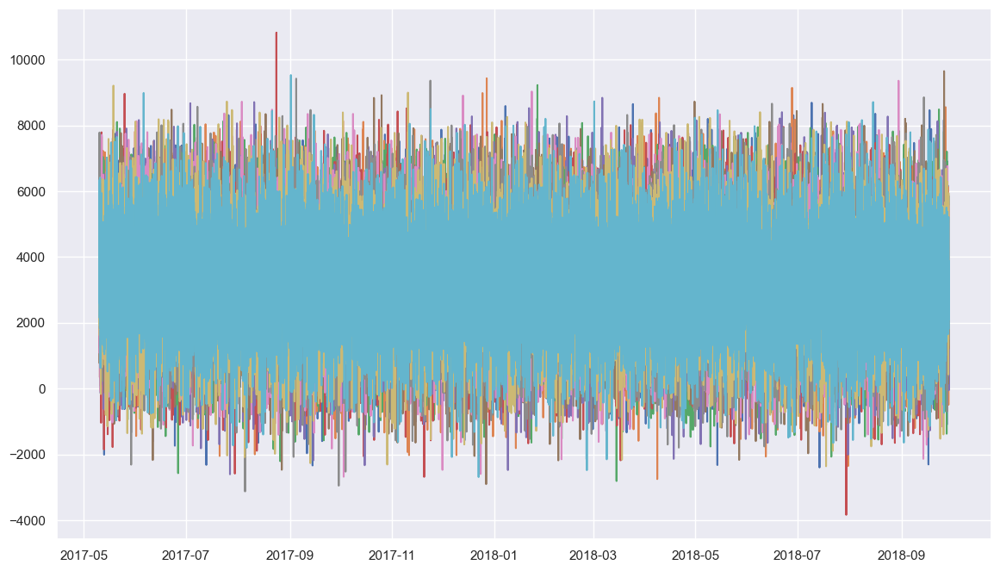

In [97]:
# Вызываем функцию plot_samples, которая принимает датафрейм df_forc_sample
# Эта функция строит график, на котором отображаются несколько случайных выборок из датафрейма, каждая из которых 
# представляет прогнозную траекторию переменной нашей переменной
# Это позволяет оценить разброс и неопределенность прогнозов, полученных с помощью разных моделей
plot_samples(df_forc_sample)

Максимальное отклонение от 4000 до 9000, стандартное отклонение от - 3000

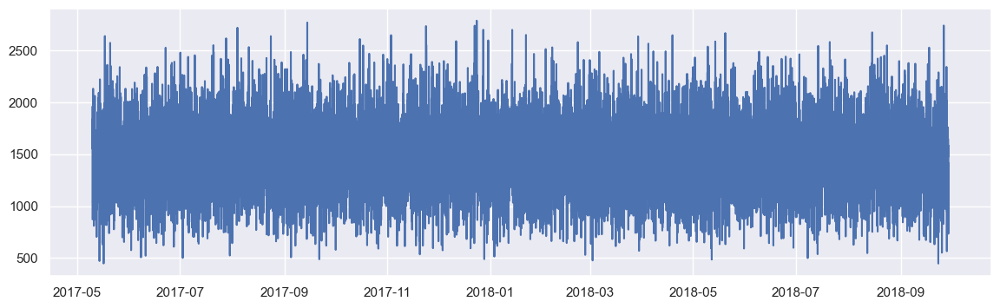

In [98]:
# Вычисляем стандартное отклонение по каждой строке датафрейма df_forc_sample, который содержит несколько прогнозов
# переменной traffic_volume, полученных с помощью бутстреп-метода
# Параметр axis=1 означает, что стандартное отклонение считается по столбцам, то есть по разным прогнозам для одного и того же времени
# Результат сохраняется в серии error_std, которая показывает, насколько различаются прогнозы между собой
error_std = df_forc_sample.std(axis=1)

# Эта строка создает новую фигуру с заданным размером
plt.figure(figsize=(14,4))
# Эта строка строит график для серии error_std, который показывает, как меняется стандартное отклонение прогнозов во времени
plt.plot(error_std)
# Эта строка выводит график на экран
plt.show()

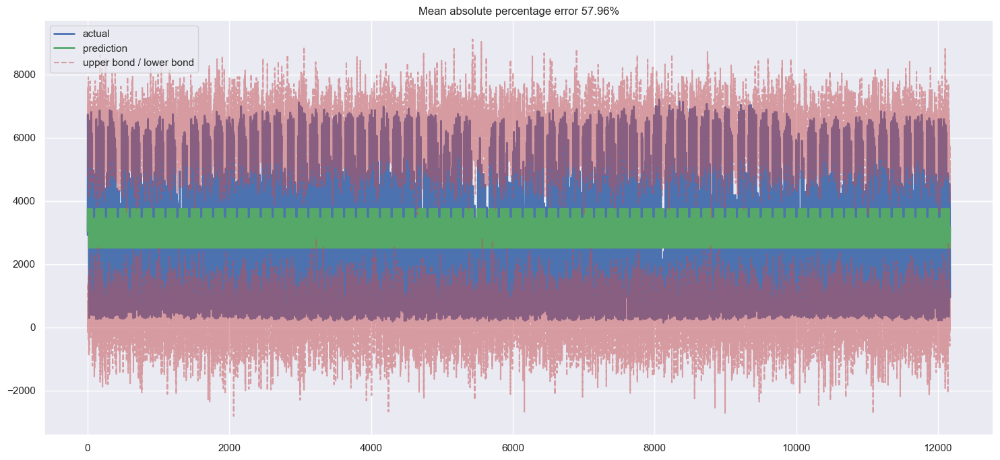

In [99]:
# Вызываем функцию plotRecursivePredictionConfInterval, которая принимает тестовый ряд данных series_test.traffic_volume,
#прогнозный ряд данных df_forecasted.traffic_volume и серию error_std, которая содержит стандартные отклонения прогнозов
# Эта функция строит график, на котором отображаются фактические и прогнозные значения переменной traffic_volume, 
# а также доверительные интервалы для прогнозов, рассчитанные на основе error_std
# Это позволяет оценить точность и неопределенность прогнозов, полученных с помощью градиентного бустинга и бутстреп-метода
plotRecursivePredictionConfInterval(series_test.traffic_volume, df_forecasted.traffic_volume, error_std)

- посмотрим ещё модели

##### Пакет prophet - это библиотека для прогнозирования временных рядов, основанная на аддитивной модели с сезонностью и эффектами праздников

In [8]:
# Пакет prophet - это библиотека для прогнозирования временных рядов, основанная на аддитивной модели с сезонностью 
# и эффектами праздников
# Подробнее о пакете prophet можно узнать на [этом сайте](https://facebook.github.io/prophet/docs/installation.html) 
# или в [этой статье](https://pypi.org/project/prophet/)
# !pip install prophet

In [9]:
# Импортирует класс Prophet из библиотеки prophet, которая позволяет прогнозировать временные ряды с помощью аддитивной модели
from prophet import Prophet
# Импортируем две функции plot_plotly и plot_components_plotly из модуля prophet.plot, которые позволяют
# визуализировать прогнозы и их компоненты с помощью библиотеки plotly
from prophet.plot import plot_plotly, plot_components_plotly

# Cоздаем новый датафрейм df_fbp, который будет использоваться для подготовки данных для модели prophet
df_fbp = pd.DataFrame()
# Эта строка создает столбец ds в датафрейме df_fbp, который содержит даты из индекса датафрейма df, преобразованные в формат datetime
df_fbp["ds"] = pd.to_datetime(df.index)
# Эта строка создает столбец y в датафрейме df_fbp, который содержит значения переменной x из датафрейма df
df_fbp["y"] = df["traffic_volume"].values


In [10]:
# Посмотрим  на данные
df_fbp.head()

,ds,y
0,1970-01-01 00:00:00.000000000,5545
1,1970-01-01 00:00:00.000000001,4516
2,1970-01-01 00:00:00.000000002,4767
3,1970-01-01 00:00:00.000000003,5026
4,1970-01-01 00:00:00.000000004,4918


In [11]:
# Разбиваем датафрейм df_fbp, который содержит данные для модели prophet, на обучающий, тестовый и валидационный наборы
# Это делается с помощью метода iloc, который позволяет выбирать строки и столбцы по их индексам
# Параметр :-300 означает, что будут выбраны все строки, кроме последних 300
# Параметр -300: означает, что будут выбраны последние 300 строк
# Параметр ["ds"] означает, что будет выбран только столбец с именем "ds"
# Метод copy создает копию выбранных данных, чтобы избежать предупреждений о присваивании по ссылке
fb_y_train = df_fbp.iloc[:-300].copy() # Эта строка создает обучающий набор данных, который содержит все строки 
# и столбцы из df_fbp, кроме последних 300 строк
fb_y_test = df_fbp.iloc[-300:].copy() # Эта строка создает тестовый набор данных, который содержит последние 300 строк 
# и все столбцы из df_fbp
fb_y_val = fb_y_test[["ds"]].copy() # Эта строка создает валидационный набор данных, который содержит последние 
# 300 строк и только столбец "ds" из df_fbp

In [12]:
# Используем библиотеку prophet для прогнозирования временных рядов с помощью аддитивной модели,
# которая учитывает тренд, сезонность и эффекты праздников
# Эта библиотека была разработана командой Facebook и подробно описана на [этом сайте](https://facebook.github.io/prophet/)
# и в [этой статье](https://facebook.github.io/prophet/docs/quick_start.html)
# Мы подготовили данные для модели prophet в датафрейме df_fbp, 
# который содержит два столбца: ds - даты и y - значения переменной, которую нужно прогнозировать
# Мы уже разбили данные на обучающий, тестовый и валидационный наборы
# в датафреймах fb_y_train, fb_y_test и fb_y_val соответственно
fbmodel = Prophet() # Эта строка создает объект fbmodel, который представляет класс Prophet из библиотеки prophet
fbmodel.fit(fb_y_train) # Эта строка обучает модель fbmodel на основе обучающих данных fb_y_train, используя метод fit
forecast = fbmodel.predict(fb_y_val) # Эта строка делает прогнозы для валидационных данных fb_y_val, используя метод predict,
# и сохраняет результат в датафрейме forecast

21:53:56 - cmdstanpy - INFO - Chain [1] start processing
21:54:05 - cmdstanpy - INFO - Chain [1] done processing


In [13]:
# Датафрейм forecast содержит прогнозы для временного ряда с помощью модели ARIMA
# Каждая строка соответствует одному дню, а столбцы - различным статистикам прогноза
# Например, столбец predicted_mean - это среднее значение прогноза, а столбцы pi_lower и pi_upper - это доверительный интервал прогноза
# Метод tail() возвращает последние n строк из датафрейма, где n - это аргумент метода
# Если аргумент не указан, то по умолчанию возвращается 5 строк
# Таким образом, forecast.tail() возвращает последние 5 строк из датафрейма forecast
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
295,1970-01-01 00:00:00.000048199,3266.802107,750.903526,5777.372327,3266.802107,3266.802107,0.0,0.0,0.0,0.0,0.0,0.0,3266.802107
296,1970-01-01 00:00:00.000048200,3266.796397,705.006602,5829.726657,3266.796397,3266.796397,0.0,0.0,0.0,0.0,0.0,0.0,3266.796397
297,1970-01-01 00:00:00.000048201,3266.790687,896.084049,5676.153679,3266.790687,3266.790687,0.0,0.0,0.0,0.0,0.0,0.0,3266.790687
298,1970-01-01 00:00:00.000048202,3266.784978,763.713741,5782.299993,3266.784978,3266.784978,0.0,0.0,0.0,0.0,0.0,0.0,3266.784978
299,1970-01-01 00:00:00.000048203,3266.779268,696.914485,5675.446068,3266.779268,3266.779268,0.0,0.0,0.0,0.0,0.0,0.0,3266.779268


- Нагенирили признаки

Несколько советов:
для SARIMA модели имеет смысл указать недельную сезонность (т.е. 24*7), чтобы она учла падения по выходным;
попробуйте использовать температуру воздуха, как признак, в этом случае можно отдельно спрогнозировать температуру (например, используя SARIMA), а затем воспользоваться этими предсказаниями, когда будете делать прогноз для отложенной части выборки.
Наконец, когда вы подберете модель, устраивающую вас по качеству на отложенной выборке, используйте эту выборку для построения прогноза на следующую неделю и попробуйте построить доверительные интервалы для этого прогноза.
Теперь вы круто разбираетесь в прогнозировании и временных рядах :)

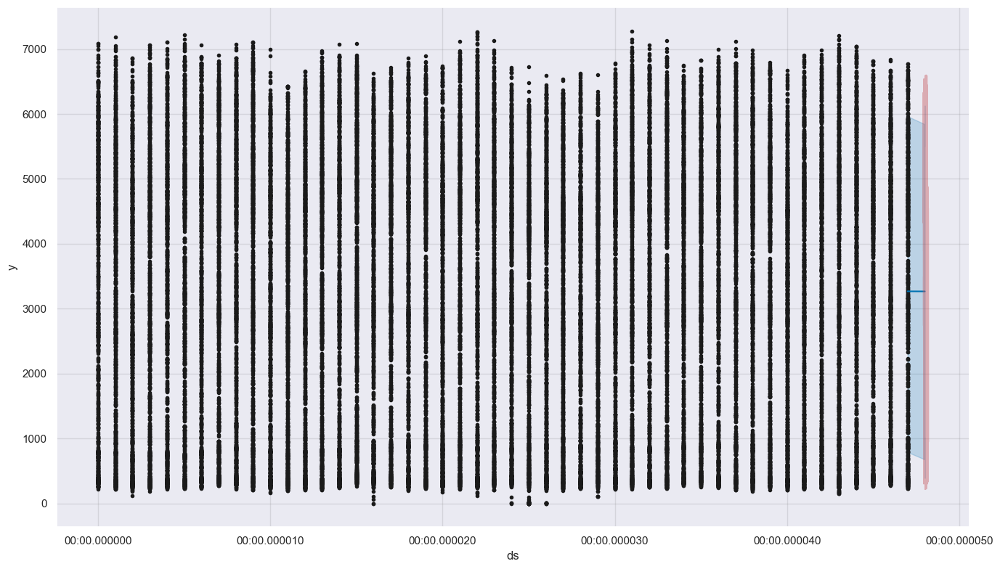

In [14]:
# Модель fbmodel - это объект класса Prophet, который используется для прогнозирования временных рядов
# Метод plot() строит график прогноза с доверительными интервалами и историческими данными
# Аргумент forecast - это датафрейм, который содержит прогнозные значения и статистики
# Аргумент figsize - это кортеж, который задает размер фигуры в дюймах
# Метод plot() возвращает объект класса Figure, который сохраняется в переменной fig2
fig2 = fbmodel.plot(forecast, figsize=(14,8))

# Модуль plt - это сокращение для matplotlib.pyplot, который используется для построения графиков в Python
# Метод plot() строит линейный график по двум массивам данных
# Аргументы fb_y_test["ds"] и fb_y_test["y"] - это столбцы датафрейма fb_y_test, который содержит реальные данные для тестовой выборки
# Аргумент c="r" задает цвет линии в красный
# Аргумент alpha=0.4 задает прозрачность линии в 40%
# Метод plot() добавляет линию к текущей фигуре fig2
plt.plot(fb_y_test["ds"], fb_y_test["y"], c="r", alpha=0.4)

# Метод show() отображает фигуру fig2 на экране
# Этот метод должен быть вызван после всех операций построения графика
plt.show()

In [16]:
# Модель fbmodel - это объект класса Prophet, который используется для прогнозирования временных рядов
# Метод plot_plotly() строит интерактивный график прогноза с доверительными интервалами и историческими данными,
# используя библиотеку plotly
# Аргумент forecast - это датафрейм, который содержит прогнозные значения и статистики
# Метод plot_plotly() возвращает объект класса Figure, который можно отобразить или сохранить
plot_plotly(fbmodel, forecast)

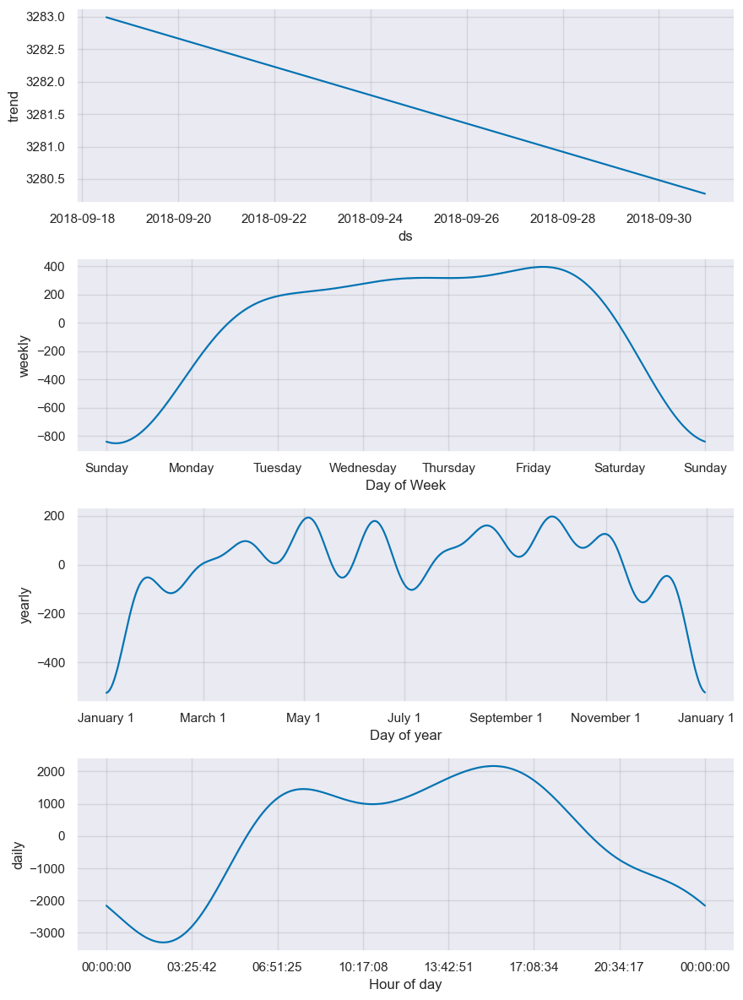

In [122]:
# Модель fbmodel - это объект класса Prophet, который используется для прогнозирования временных рядов
# Метод plot_components() строит графики для различных компонентов прогноза, таких как тренд, сезонность, праздники и дополнительные регрессоры
# Аргумент forecast - это датафрейм, который содержит прогнозные значения и статистики
# Метод plot_components() возвращает объект класса Figure, который можно отобразить или сохранить
# Префикс _ означает, что мы игнорируем возвращаемое значение метода plot_components(), так как мы не собираемся его использовать
_ = fbmodel.plot_components(forecast)

- библиотека выводит наглядное представление

#### Предложения:
- Мы уже сделали отличную работу по прогнозированию загруженности метро.
- Можно что-то придумать?
- Вот несколько идей:
- Мы можем попробовать другие модели, например, решающее дерево или нейронную сеть, и сравнить их с SARIMA по метрикам качества и скорости обучения и прогнозирования.
- Также можем попробовать добавить другие признаки, например, давление, влажность, скорость ветра, осадки, видимость, облачность, солнечное излучение и т.д., и посмотреть, как они влияют на загруженность метро.
- И попробовать улучшить визуализацию прогноза, например, сделать интерактивный график с помощью библиотеки Plotly, добавить подписи к осям и легенду, изменить цвета и стили линий и т.д.

Спасибо за внимание!